<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 1: Data Analysis of Singapore Rainfall

--- 
# Part 1

Part 1 requires knowledge of basic Python.

---

### Contents:
- [Background](#Background)
- [Data Import & Cleaning](#Data-Import-and-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Data Visualization](#Visualize-the-Data)
- [Conclusions and Recommendations](#Conclusions-and-Recommendations)

## Background

According to the [Meteorological Services Singapore](http://www.weather.gov.sg/climate-climate-of-singapore/#:~:text=Singapore%20is%20situated%20near%20the,month%2Dto%2Dmonth%20variation.), Singapore has typical tropical climate with adundant rainfall, high and uniform temperatures and high humidity all year round, since its situated near the equator. There are many factors that help us understand the climate of a country and in this project we are going to look into a few, especially rainfall.

Singapore’s climate is characterised by two main monsoon seasons separated by inter-monsoonal periods.  The **Northeast Monsoon** occurs from December to early March, and the **Southwest Monsoon** from June to September.

The major weather systems affecting Singapore that can lead to heavy rainfall are:

-Monsoon surges, or strong wind episodes in the Northeast Monsoon flow bringing about major rainfall events;

-Sumatra squalls, an organised line of thunderstorms travelling eastward across Singapore, having developed over the island of Sumatra or Straits of Malacca west of us;

-Afternoon and evening thunderstorms caused by strong surface heating and by the sea breeze circulation that develops in the afternoon.

Singapore’s climate station has been located at several different sites in the past 140 years. The station had been decommissioned at various points in the past due to changes to local land use in the site’s vicinity, and had to be relocated. Since 1984, the climate station has been located at **Changi**.

There are other metrics of climate such as temperature, humidity, sun shine duration, wind speed, cloud cover etc. All the dataset used in the project comes from [data.gov.sg](data.gov.sg), as recorded at the Changi climate station 


### Choose your Data

There are 2 datasets included in the [`data`](./data/) folder for this project. These correponds to rainfall information. 

* [`rainfall-monthly-number-of-rain-days.csv`](./data/rainfall-monthly-number-of-rain-days.csv): Monthly number of rain days from 1982 to 2022. A day is considered to have “rained” if the total rainfall for that day is 0.2mm or more.
* [`rainfall-monthly-total.csv`](./data/rainfall-monthly-total.csv): Monthly total rain recorded in mm(millimeters) from 1982 to 2022

Other relevant weather datasets from [data.gov.sg](data.gov.sg) that you can download and use are as follows:

* [Relative Humidity](https://data.gov.sg/dataset/relative-humidity-monthly-mean)
* [Monthly Maximum Daily Rainfall](https://data.gov.sg/dataset/rainfall-monthly-maximum-daily-total)
* [Hourly wet buld temperature](https://data.gov.sg/dataset/wet-bulb-temperature-hourly)
* [Monthly mean sunshine hours](https://data.gov.sg/dataset/sunshine-duration-monthly-mean-daily-duration)
* [Surface Air Temperature](https://data.gov.sg/dataset/surface-air-temperature-mean-daily-minimum)

You can also use other datasets for your analysis, make sure to cite the source when you are using them

**To-Do:** *Fill out this cell with the datasets you will use for your analysis. Write a brief description of the contents for each dataset that you choose.*

## Problem Statement

Decide on your problem statement that will guide your analysis for this project. For guidelines, sample prompts, or inspiration, check out the README.

**To-Do:** *Replace this cell with your problem statement.*

Rainfall affects daily activities of Singapore population, hence it is worth analysing rainfall data to identify trends 

### Outside Research

Based on your problem statement and your chosen datasets, spend some time doing outside research on how climate change is affecting different industries or additional information that might be relevant. Summarize your findings below. If you bring in any outside tables or charts, make sure you are explicit about having borrowed them. If you quote any text, make sure that it renders as being quoted. **Make sure that you cite your sources.**

**To-Do:** *Fill out this cell with outside research or any additional background information that will support your analysis.*

### Coding Challenges

1. Manually calculate mean:

    Write a function that takes in values and returns the mean of the values. Create a list of numbers that you test on your function to check to make sure your function works!
    
    *Note*: Do not use any mean methods built-in to any Python libraries to do this! This should be done without importing any additional libraries.

In [93]:
# Code:
def find_mean(test_lst):
    total = 0
    count = 0
    for i in test_lst:
        total += i
        count += 1
    ans = total / count
    return ans

test_lst = [10, 12, 23, 23, 16, 23, 21, 16]

find_mean(test_lst)

18.0

2. Manually calculate standard deviation:

    The formula for standard deviation is below:

    $$\sigma = \sqrt{\frac{1}{n}\sum_{i=1}^n(x_i - \mu)^2}$$

    Where $x_i$ represents each value in the dataset, $\mu$ represents the mean of all values in the dataset and $n$ represents the number of values in the dataset.

    Write a function that takes in values and returns the standard deviation of the values using the formula above. Hint: use the function you wrote above to calculate the mean! Use the list of numbers you created above to test on your function.
    
    *Note*: Do not use any standard deviation methods built-in to any Python libraries to do this! This should be done without importing any additional libraries.

In [94]:
# Code:
def std_dev(test_lst):
    total = 0
    count = 0
    for i in test_lst:
        total += (i - find_mean(test_lst)) ** 2
        count += 1
    ans = (total / count) ** 0.5
    return ans

std_dev(test_lst)

4.898979485566356

--- 
# Part 2

Part 2 requires knowledge of Pandas, EDA, data cleaning, and data visualization.

---

*All libraries used should be added here*

In [95]:
# Imports:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from IPython.display import HTML

%config InlineBackend.figure_format = 'retina'

## Data Import and Cleaning

### Data Import & Cleaning

Import all the datasets that you selected for this project and go through the following steps at a minimum. You are welcome to do further cleaning as you feel necessary. Make sure to comment your code to showcase the intent behind the data processing step.
1. Display the data: print the first 5 rows of each dataframe to your Jupyter notebook.
2. Check for missing values and datatype.
3. Check for any obvious issues with the observations.
4. Fix any errors you identified in steps 2-3.
6. Fix any incorrect data types found in step 5.
    - Fix any individual values preventing other columns from being the appropriate type.
    - If the month column data is better analyzed as month and year, create new columns for the same
7. Rename Columns.
    - Column names should be all lowercase.
    - Column names should not contain spaces (underscores will suffice--this allows for using the `df.column_name` method to access columns in addition to `df['column_name']`).
    - Column names should be unique and informative.
8. Drop unnecessary rows (if needed).
9. Merge dataframes that can be merged.
    - Since different climate metrics are in month format, you can merge them into one single dataframe for easier analysis
10. Perform any additional cleaning that you feel is necessary.
11. Save your cleaned and merged dataframes as csv files.

In [96]:
# Import the csv into a pandas DataFrame
h_daily_total = pd.read_csv('../data/rainfall-monthly-highest-daily-total.csv')
mthly_rainy_days = pd.read_csv('../data/rainfall-monthly-number-of-rain-days.csv')
mthly_rainfall_total = pd.read_csv('../data/rainfall-monthly-total.csv')
humidity = pd.read_csv('../data/relative-humidity-monthly-mean.csv')
humidity_min = pd.read_csv('../data/relative-humidity-absolute-monthly-extreme-minimum.csv')
sunshine = pd.read_csv('../data/sunshine-duration-monthly-mean-daily-duration.csv')
s_temp_mean = pd.read_csv('../data/surface-air-temperature-monthly-mean.csv')
s_temp_min_mean = pd.read_csv('../data/surface-air-temperature-monthly-mean-daily-minimum.csv')
s_temp_max_mean = pd.read_csv('../data/surface-air-temperature-monthly-mean-daily-maximum.csv')
wet_bulb_temp = pd.read_csv('../data/wet-bulb-temperature-hourly.csv')

# Display the data: print the first 5 rows of each dataframe to your Jupyter notebook
lst_of_df = [h_daily_total, mthly_rainy_days, mthly_rainfall_total, humidity, humidity_min, sunshine, 
             s_temp_mean, s_temp_min_mean, s_temp_max_mean, wet_bulb_temp]

for i in lst_of_df:
    display(i.head())

,month,maximum_rainfall_in_a_day
0,1982-01,36.5
1,1982-02,9.4
2,1982-03,61.7
3,1982-04,45.1
4,1982-05,33.0


,month,no_of_rainy_days
0,1982-01,10
1,1982-02,5
2,1982-03,11
3,1982-04,14
4,1982-05,10


,month,total_rainfall
0,1982-01,107.1
1,1982-02,27.8
2,1982-03,160.8
3,1982-04,157.0
4,1982-05,102.2


,month,mean_rh
0,1982-01,81.2
1,1982-02,79.5
2,1982-03,82.3
3,1982-04,85.9
4,1982-05,83.2


,month,rh_extremes_minimum
0,1982-01,49
1,1982-02,49
2,1982-03,51
3,1982-04,54
4,1982-05,57


,month,mean_sunshine_hrs
0,1982-01,5.6
1,1982-02,7.6
2,1982-03,5.1
3,1982-04,4.7
4,1982-05,5.8


,month,mean_temp
0,1982-01,25.9
1,1982-02,27.1
2,1982-03,27.2
3,1982-04,27.0
4,1982-05,28.0


,month,temp_mean_daily_min
0,1982-01,23.3
1,1982-02,23.9
2,1982-03,24.3
3,1982-04,24.3
4,1982-05,25.2


,month,temp_mean_daily_max
0,1982-01,29.8
1,1982-02,32.3
2,1982-03,31.7
3,1982-04,31.4
4,1982-05,31.7


,wbt_date,wbt_time,wet_bulb_temperature
0,1982-01-01,1,24.7
1,1982-01-01,2,24.5
2,1982-01-01,3,24.3
3,1982-01-01,4,24.2
4,1982-01-01,5,24.2


In [97]:
wet_bulb_temp[wet_bulb_temp['wbt_date']=='1986-04-13'].tail(1)

,wbt_date,wbt_time,wet_bulb_temperature
37534,1986-04-13,23,24.5


In [98]:
# fix potential data entry error
wet_bulb_temp.loc[wet_bulb_temp['wbt_time'] == 0,'wbt_date']='1986-04-13'
wet_bulb_temp.loc[wet_bulb_temp['wbt_time'] == 0,'wbt_time']=24
wet_bulb_temp[wet_bulb_temp['wbt_date']=='1986-04-13'].tail(1)

,wbt_date,wbt_time,wet_bulb_temperature
37535,1986-04-13,24,24.6


In [99]:
# drop 'useless' column
wet_bulb_temp_copy = wet_bulb_temp
wet_bulb_temp_copy = wet_bulb_temp.drop(columns = ['wbt_time'],axis=1)

# to convert object to python datetime 
wet_bulb_temp_copy['wbt_date'] = pd.to_datetime(wet_bulb_temp_copy['wbt_date'])
# to check use: wet_bulb_temp.info()
wet_bulb_temp[wet_bulb_temp['wbt_time']==0]

,wbt_date,wbt_time,wet_bulb_temperature


Observed abnormal data point for 1986-04-14 where wet_bulb_temp['wbt_time' = 0]. This is likely a data entry error which has been fixed by changing it to wbt_date=1986-04-13, wbt_time=24, as it was missing. 

In [100]:
# group the hours / days to month and find mean
wb_temp = wet_bulb_temp_copy.resample('M', on="wbt_date").mean()

# change the datetime index back into a col instead of index
wb_temp.reset_index(inplace=True)

# create a new col 'month' with only year-month
wb_temp["month"] = wb_temp["wbt_date"].dt.strftime('%Y-%m')

# drop wbt_date
wb_temp.drop(columns = ['wbt_date'], axis=1, inplace=True)
display(wb_temp)

,wet_bulb_temperature,month
0,23.456048,1982-01
1,24.297619,1982-02
2,24.811559,1982-03
3,25.103750,1982-04
4,25.689651,1982-05
...,...,...
491,24.303763,2022-12
492,24.160887,2023-01
493,24.211161,2023-02
494,24.308199,2023-03


In [101]:
# update list of dataframes
lst_of_df[-1] = wb_temp 

# merge all files by month
climate = pd.merge(h_daily_total, mthly_rainy_days, on='month', how='inner')

for i in lst_of_df[2:]: # excl h_daily_total and mthly_rainy_days since done above
    climate = pd.merge(climate, i, on='month', how='inner')

In [102]:
# convert month to datetime
climate['month'] = pd.to_datetime(climate['month'])
climate['month'].info()

<class 'pandas.core.series.Series'>
Int64Index: 496 entries, 0 to 495
Series name: month
Non-Null Count  Dtype         
--------------  -----         
496 non-null    datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 7.8 KB


In [103]:
# change name of col: 'month' to 'date'
climate.rename(columns={'month': 'date'}, inplace=True)
climate.tail()

,date,maximum_rainfall_in_a_day,no_of_rainy_days,total_rainfall,mean_rh,rh_extremes_minimum,mean_sunshine_hrs,mean_temp,temp_mean_daily_min,temp_mean_daily_max,wet_bulb_temperature
491,2022-12-01,37.0,19,215.4,81.2,52,3.6,26.8,24.5,30.3,24.303763
492,2023-01-01,72.0,22,302.6,81.9,43,4.4,26.5,24.5,30.1,24.160887
493,2023-02-01,154.8,13,324.4,79.4,50,5.1,26.9,24.5,31.0,24.211161
494,2023-03-01,90.2,12,243.4,79.2,52,6.0,27.1,24.6,30.9,24.308199
495,2023-04-01,85.8,19,222.8,77.4,57,5.8,28.5,25.8,32.6,25.440139


In [104]:
# remove 2023 since 2023 not complete year. 
index_drop_2023=climate[climate['date'].dt.strftime('%Y')=='2023'].index
climate.drop(index_drop_2023, inplace=True)
climate.tail()

,date,maximum_rainfall_in_a_day,no_of_rainy_days,total_rainfall,mean_rh,rh_extremes_minimum,mean_sunshine_hrs,mean_temp,temp_mean_daily_min,temp_mean_daily_max,wet_bulb_temperature
487,2022-08-01,32.4,15,141.4,77.4,50,5.5,28.1,25.8,31.2,25.072312
488,2022-09-01,38.2,14,121.0,76.9,52,3.8,27.9,25.4,31.1,24.833889
489,2022-10-01,38.8,27,279.0,78.7,47,3.5,27.6,24.7,31.5,24.688575
490,2022-11-01,53.0,26,313.8,79.9,46,3.8,27.4,24.4,31.4,24.674306
491,2022-12-01,37.0,19,215.4,81.2,52,3.6,26.8,24.5,30.3,24.303763


In [105]:
# check data
display(climate.info())

# check for null
display(climate.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 492 entries, 0 to 491
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       492 non-null    datetime64[ns]
 1   maximum_rainfall_in_a_day  492 non-null    float64       
 2   no_of_rainy_days           492 non-null    int64         
 3   total_rainfall             492 non-null    float64       
 4   mean_rh                    492 non-null    float64       
 5   rh_extremes_minimum        492 non-null    int64         
 6   mean_sunshine_hrs          492 non-null    float64       
 7   mean_temp                  492 non-null    float64       
 8   temp_mean_daily_min        492 non-null    float64       
 9   temp_mean_daily_max        492 non-null    float64       
 10  wet_bulb_temperature       492 non-null    float64       
dtypes: datetime64[ns](1), float64(8), int64(2)
memory usage: 46.1 KB


None

date                         0
maximum_rainfall_in_a_day    0
no_of_rainy_days             0
total_rainfall               0
mean_rh                      0
rh_extremes_minimum          0
mean_sunshine_hrs            0
mean_temp                    0
temp_mean_daily_min          0
temp_mean_daily_max          0
wet_bulb_temperature         0
dtype: int64

### Data Dictionary

Now that we've fixed our data, and given it appropriate names, let's create a [data dictionary](http://library.ucmerced.edu/node/10249). 

A data dictionary provides a quick overview of features/variables/columns, alongside data types and descriptions. The more descriptive you can be, the more useful this document is.

Example of a Fictional Data Dictionary Entry: 

|Feature|Type|Dataset|Description|
|---|---|---|---|
|**county_pop**|*integer*|2010 census|The population of the county (units in thousands, where 2.5 represents 2500 people).| 
|**per_poverty**|*float*|2010 census|The percent of the county over the age of 18 living below the 200% of official US poverty rate (units percent to two decimal places 98.10 means 98.1%)|

[Here's a quick link to a short guide for formatting markdown in Jupyter notebooks](https://jupyter-notebook.readthedocs.io/en/stable/examples/Notebook/Working%20With%20Markdown%20Cells.html).

Provided is the skeleton for formatting a markdown table, with columns headers that will help you create a data dictionary to quickly summarize your data, as well as some examples. **This would be a great thing to copy and paste into your custom README for this project.**

*Note*: if you are unsure of what a feature is, check the source of the data! This can be found in the README.

**To-Do:** *Edit the table below to create your own data dictionary for the datasets you chose.*

|Feature|Type|Dataset|Unit of Measure|Description|
|---|---|---|---|---|
|maximum_rainfall_in_a_day|float|h_daily_total|Millimetre|The highest daily total rainfall for the month recorded at the Changi Climate Station.| 
|no_of_rainy_days|int|mthly_rainy_days|Days|The number of rain days (day with rainfall amount of 0.2mm or more) in a month recorded at the Changi Climate Station.| 
|total_rainfall|float|mthly_rainfall_total|Millimetre|The total monthly rainfall recorded at the Changi Climate Station.| 
|mean_rh|float|humidity|Percentage|The monthly mean relative humidity recorded at the Changi Climate Station.| 
|rh_extremes_minimum|int|humidity_min|Percentage|The absolute extreme minimum relative humidity for the month recorded at the Changi Climate Station.| 
|mean_sunshine_hrs|float|sunshine|Hours|The monthly mean sunshine hours in a day recorded at the Changi Climate Station.| 
|mean_temp|float|surface_temp|Degree Celsius|The monthly mean air temperature recorded at the Changi Climate Station.| 
|temp_mean_daily_min|float|s_temp_min_mean|Degree Celsius|The monthly mean daily minimum temperature recorded at the Changi Climate Station.| 
|temp_mean_daily_max|float|s_temp_max_mean|Degree Celsius|The monthly mean daily maximum temperature recorded at the Changi Climate Station.| 
|wet_bulb_temperature|float|wb_temp|Degree Celsius|The monthly mean hourly wet bulb temperature recorded at the Changi Climate Station. Wet bulb temperature mirrors how the human body cools itself with sweat.| 


## Exploratory Data Analysis

Complete the following steps to explore your data. You are welcome to do more EDA than the steps outlined here as you feel necessary:
1. Summary Statistics.
2. Use a **dictionary comprehension** to apply the standard deviation function you create in part 1 to each numeric column in the dataframe.  **No loops**.
    - Assign the output to variable `sd` as a dictionary where: 
        - Each column name is now a key 
        - That standard deviation of the column is the value 
        - *Example Output :* `{'rainfall-monthly-total': xxx, 'no_of_rainy_days': xxx, ...}`
3. Investigate trends in the data.
    - Using sorting and/or masking (along with the `.head()` method to avoid printing our entire dataframe), consider questions relevant to your problem statement. Some examples are provided below (but feel free to change these questions for your specific problem):
        - Which month have the highest and lowest total rainfall in 1990, 2000, 2010 and 2020?
        - Which year have the highest and lowest total rainfall in the date range of analysis?
        - Which month have the highest and lowest number of rainy days in 1990, 2000, 2010 and 2020?
        - Which year have the highest and lowest number of rainy days in the date range of analysis?
        - Are there any outliers months in the dataset?
       
    - **The above 5 questions are compulsory. Feel free to explore other trends based on the datasets that you have choosen for analysis. You should comment on your findings at each step in a markdown cell below your code block**. Make sure you include at least one example of sorting your dataframe by a column, and one example of using boolean filtering (i.e., masking) to select a subset of the dataframe.

In [106]:
# summarize
climate.describe()

,maximum_rainfall_in_a_day,no_of_rainy_days,total_rainfall,mean_rh,rh_extremes_minimum,mean_sunshine_hrs,mean_temp,temp_mean_daily_min,temp_mean_daily_max,wet_bulb_temperature
count,492.000000,492.000000,492.000000,492.000000,492.000000,492.000000,492.000000,492.000000,492.000000,492.000000
mean,52.246138,14.121951,177.611992,82.222561,50.520325,5.671951,27.676829,24.918089,31.525203,25.253051
std,35.618098,4.995453,113.751876,3.414197,5.512585,1.214402,0.800071,0.733000,0.866681,0.594548
min,0.200000,1.000000,0.200000,72.000000,33.000000,2.700000,25.400000,22.900000,28.800000,23.391129
25%,30.850000,11.000000,94.150000,79.900000,47.000000,4.800000,27.100000,24.400000,31.000000,24.902688
50%,43.650000,14.000000,159.700000,82.600000,51.000000,5.600000,27.700000,24.900000,31.500000,25.283663
75%,62.775000,18.000000,238.625000,84.625000,55.000000,6.425000,28.300000,25.400000,32.100000,25.642360
max,216.200000,27.000000,765.900000,90.700000,61.000000,9.300000,29.500000,27.100000,34.400000,26.913978


In [107]:
# using iloc to remove(split) unwanted col (month)
my_dict = climate.iloc[:, 1:].to_dict('list')

# dictionary comprehension
sd = {key:std_dev(val) for key, val in my_dict.items()}
display(sd)

{'maximum_rainfall_in_a_day': 35.581882626773,
 'no_of_rainy_days': 4.990373441642558,
 'total_rainfall': 113.6362154861565,
 'mean_rh': 3.41072542327122,
 'rh_extremes_minimum': 5.506979449613963,
 'mean_sunshine_hrs': 1.2131670295235129,
 'mean_temp': 0.7992575997061785,
 'temp_mean_daily_min': 0.7322548482146249,
 'temp_mean_daily_max': 0.8657994562980569,
 'wet_bulb_temperature': 0.5939434247906251}

In [108]:
# Which month have the highest and lowest total rainfall in 1990, 2000, 2010 and 2020?
# group the 'month' by year

'''
if i want to display the entire list of min (min of total_rainfall)
# using the grouping, find index of min 'total_rainfall' for each year. display only 'date' and 'total_rainfall'
display(climate.loc[group_year['total_rainfall'].idxmin(), ['date', 'total_rainfall']])'''

lst_year = ['1990', '2000', '2010', '2020']
for i in lst_year:
    idx_min = climate.loc[climate[climate['date'].dt.strftime('%Y') == i]['total_rainfall'].idxmin(),'date']
    idx_max = climate.loc[climate[climate['date'].dt.strftime('%Y') == i]['total_rainfall'].idxmax(),'date']
    print(f'month with lowest total rainfall in {i}: {idx_min.month}')
    print(f'month with highest total rainfall in {i}: {idx_max.month}\n')

month with lowest total rainfall in 1990: 2
month with highest total rainfall in 1990: 9

month with lowest total rainfall in 2000: 9
month with highest total rainfall in 2000: 11

month with lowest total rainfall in 2010: 2
month with highest total rainfall in 2010: 7

month with lowest total rainfall in 2020: 2
month with highest total rainfall in 2020: 5



In [109]:
# Which year have the highest and lowest total rainfall in the date range of analysis?
# group by year and sum total
grp_year_total_rainfall = climate.groupby([climate.date.dt.year])['total_rainfall'].sum()

print(f'year with lowest total rainfall: {grp_year_total_rainfall.idxmin()}')
print(f'year with highest total rainfall: {grp_year_total_rainfall.idxmax()}')

year with lowest total rainfall: 1997
year with highest total rainfall: 2007


In [110]:
# sort year by highest total rainfall to lowest and list top 5 and bottom 5
display(grp_year_total_rainfall[:-1].sort_values(ascending=False).head())
display(grp_year_total_rainfall[:-1].sort_values(ascending=False).tail())

date
2007    2886.2
2021    2809.6
2001    2783.1
2006    2753.2
2013    2748.4
Name: total_rainfall, dtype: float64

date
1990    1523.8
1985    1483.9
2019    1367.5
2015    1267.1
1997    1118.9
Name: total_rainfall, dtype: float64

In [111]:
# Which month have the highest and lowest number of rainy days in 1990, 2000, 2010 and 2020?
# use .month to extract month only data from timestamp
'''
to convert timestamp to np.datetime, use:
timestamp = timestamp.to_pydatetime()
'''
lst_years = ['1990', '2000', '2010', '2020']
for i in lst_years:
    lowest_i = climate.loc[climate[climate['date'].dt.strftime('%Y') == i]['no_of_rainy_days'].idxmin(), 'date']
    highest_i = climate.loc[climate[climate['date'].dt.strftime('%Y') == i]['no_of_rainy_days'].idxmax(),'date']
    print(f'month with lowest number of rainy days in {i}: {lowest_i.month}') 
    print(f'month with highest number of rainy days in {i}: {highest_i.month}\n')

month with lowest number of rainy days in 1990: 3
month with highest number of rainy days in 1990: 9

month with lowest number of rainy days in 2000: 5
month with highest number of rainy days in 2000: 11

month with lowest number of rainy days in 2010: 2
month with highest number of rainy days in 2010: 11

month with lowest number of rainy days in 2020: 1
month with highest number of rainy days in 2020: 7



In [112]:
# Which year have the highest and lowest number of rainy days in the date range of analysis?
total_rain_days = climate.groupby(climate.date.dt.year)['no_of_rainy_days'].sum()
print(f'year with lowest number of rainy days: {total_rain_days[:-1].idxmin()}')
print(f'year with highest number of rainy days: {total_rain_days[:-1].idxmax()}')

year with lowest number of rainy days: 1997
year with highest number of rainy days: 2013


In [113]:
# sort year by highest number of rainy days to lowest and list top 5 and bottom 5
display(total_rain_days[:-1].sort_values(ascending=False).head())
display(total_rain_days[:-1].sort_values(ascending=False).tail())

date
2013    206
2017    204
2007    195
1984    191
2012    191
Name: no_of_rainy_days, dtype: int64

date
2002    139
1982    130
2015    125
2019    120
1997    116
Name: no_of_rainy_days, dtype: int64

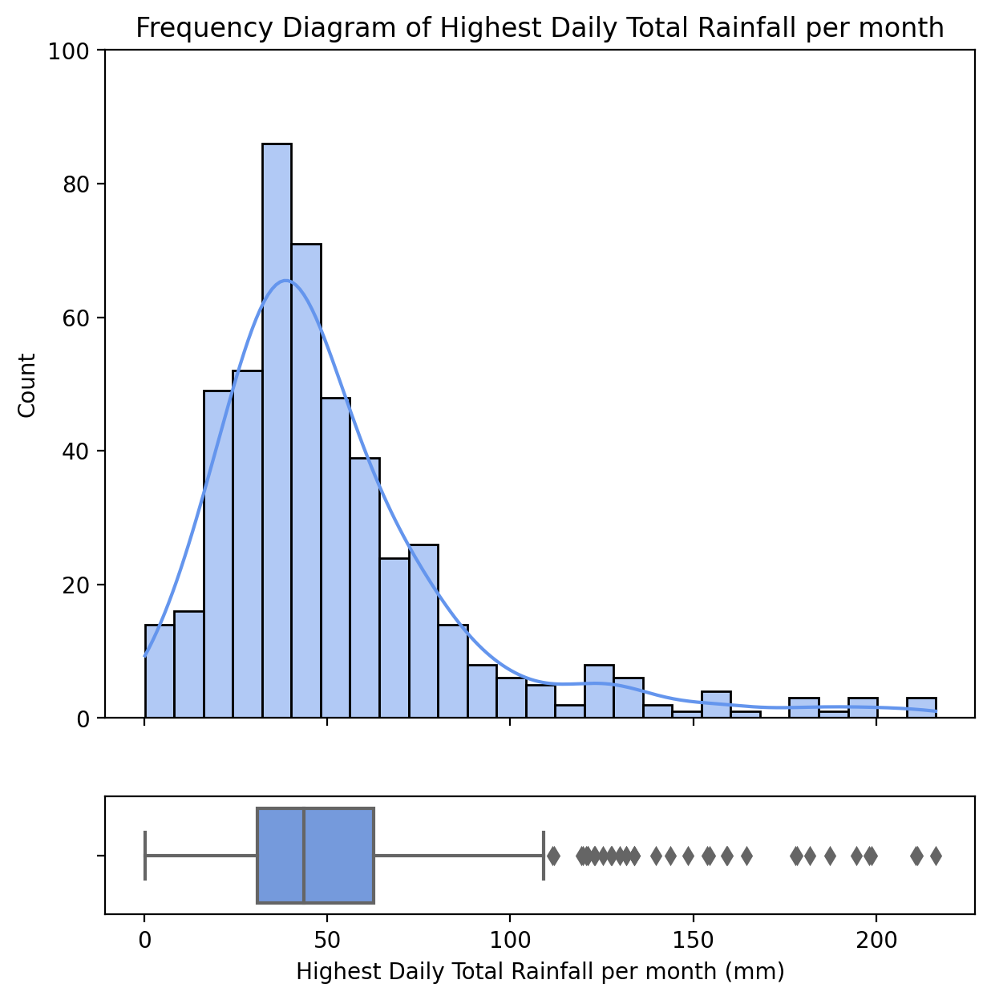

In [194]:
# Are there any outliers months in the dataset?
# outliers / anomalies = above OR below mean plus OR minus three times the standard deviation
### Visualize distributions using histograms. If you have a lot, consider writing a custom function and use subplots.
# Fit a normal distribution to the data: mean and standard deviation
fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True,gridspec_kw={"height_ratios": (.85, .15)})

sns.histplot(data=climate,x='maximum_rainfall_in_a_day', kde=True,ax=axes[0], color='cornflowerblue').set(title='Frequency Diagram of Highest Daily Total Rainfall per month',xlabel='Highest Daily Total Rainfall per month (mm)',ylim=(0,100))

#plot boxplot
sns.boxplot(climate,x='maximum_rainfall_in_a_day',ax=axes[1], color='cornflowerblue').set(title='',xlabel='Highest Daily Total Rainfall per month (mm)')
None


**To-Do:** *Edit this cell with your findings on trends in the data (step 3 above).*

## Visualize the Data

There's not a magic bullet recommendation for the right number of plots to understand a given dataset, but visualizing your data is *always* a good idea. Not only does it allow you to quickly convey your findings (even if you have a non-technical audience), it will often reveal trends in your data that escaped you when you were looking only at numbers. It is important to not only create visualizations, but to **interpret your visualizations** as well.

**Every plot should**:
- Have a title
- Have axis labels
- Have appropriate tick labels
- Text is legible in a plot
- Plots demonstrate meaningful and valid relationships
- Have an interpretation to aid understanding

Here is an example of what your plots should look like following the above guidelines. Note that while the content of this example is unrelated, the principles of visualization hold:

![](https://snag.gy/hCBR1U.jpg)
*Interpretation: The above image shows that as we increase our spending on advertising, our sales numbers also tend to increase. There is a positive correlation between advertising spending and sales.*

---

Here are some prompts to get you started with visualizations. Feel free to add additional visualizations as you see fit:
1. Use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features.
    - Heatmaps are generally not appropriate for presentations, and should often be excluded from reports as they can be visually overwhelming. **However**, they can be extremely useful in identify relationships of potential interest (as well as identifying potential collinearity before modeling).
    - Please take time to format your output, adding a title. Look through some of the additional arguments and options. (Axis labels aren't really necessary, as long as the title is informative).
2. Visualize distributions using histograms. If you have a lot, consider writing a custom function and use subplots.
    - *OPTIONAL*: Summarize the underlying distributions of your features (in words & statistics)
         - Be thorough in your verbal description of these distributions.
         - Be sure to back up these summaries with statistics.
         - We generally assume that data we sample from a population will be normally distributed. Do we observe this trend? Explain your answers for each distribution and how you think this will affect estimates made from these data.
3. Plot and interpret boxplots. 
    - Boxplots demonstrate central tendency and spread in variables. In a certain sense, these are somewhat redundant with histograms, but you may be better able to identify clear outliers or differences in IQR, etc.
    - Multiple values can be plotted to a single boxplot as long as they are of the same relative scale (meaning they have similar min/max values).
    - Each boxplot should:
        - Only include variables of a similar scale
        - Have clear labels for each variable
        - Have appropriate titles and labels
4. Plot and interpret scatter plots to view relationships between features. Feel free to write a custom function, and subplot if you'd like. Functions save both time and space.
    - Your plots should have:
        - Two clearly labeled axes
        - A proper title
        - Colors and symbols that are clear and unmistakable
5. Additional plots of your choosing.
    - Are there any additional trends or relationships you haven't explored? Was there something interesting you saw that you'd like to dive further into? It's likely that there are a few more plots you might want to generate to support your narrative and recommendations that you are building toward. **As always, make sure you're interpreting your plots as you go**.

Some ideas for plots that can be generated:

- Plot the histogram of the rainfall data with various bins and comment on the distribution of the data - is it centered, skewed?
- Plot the box-and-whiskers plot. Comment on the different quartiles and identify any outliers in the dataset. 
- Is there a correlation between the number of rainy days and total rainfall in the month? What kind of correlation do your suspect? Does the graph show the same?


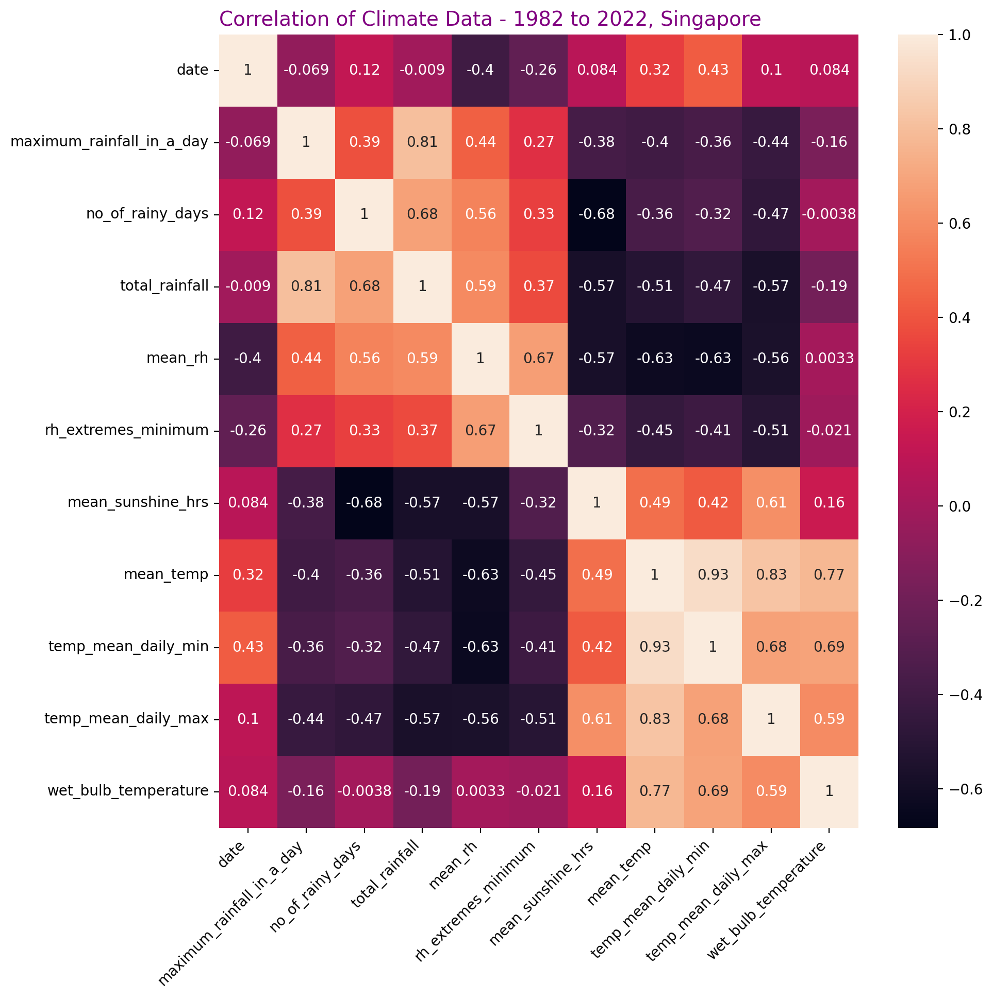

In [115]:
# Use Seaborn's heatmap with pandas .corr() to visualize correlations between all numeric features.
plt.figure(figsize=(10,10))
plt.title("Correlation of Climate Data - 1982 to 2022, Singapore", loc='left', color='purple', size=14)
g = sns.heatmap(climate.corr(numeric_only=False),annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right', color='black')
None # prevent the list of label objects showing up annoyingly in the output›

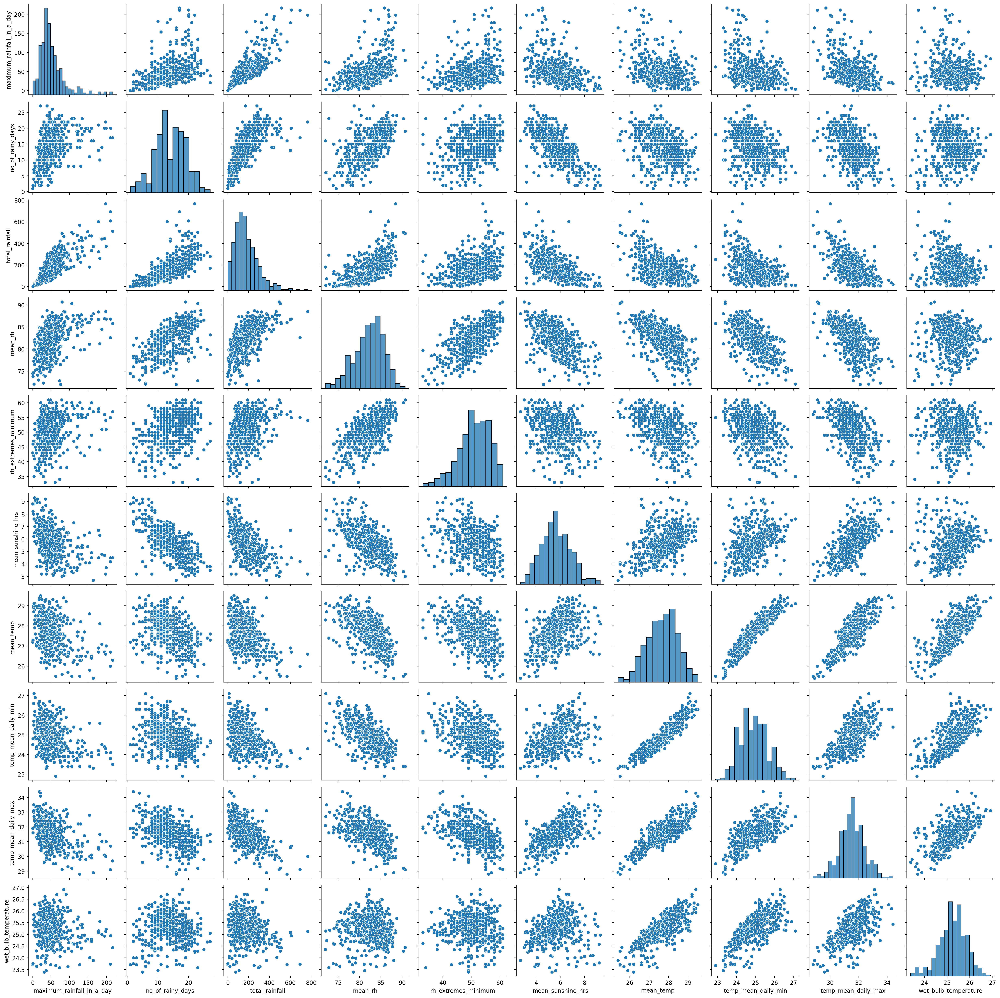

In [116]:
sns.pairplot(climate)
None

In [117]:
def corr_strength(col1,col2):
    if -0.4 >= climate[col1].corr(climate[col2]) > -0.6:
        strength='moderate negative'
    elif -0.6 >= climate[col1].corr(climate[col2]) > -0.8:
        strength='strong negative'
    elif -0.8 >= climate[col1].corr(climate[col2]) >= -1:
        strength='strong negative'
    elif 0.4 <= climate[col1].corr(climate[col2]) < 0.6:
        strength='moderate positive'
    elif 0.6 <= climate[col1].corr(climate[col2]) < 0.8:
        strength='strong positive'
    elif 0.8 <= climate[col1].corr(climate[col2]) <= 1:
        strength='very strong positive'
    return print(f"Correlation between {col1} and {col2} is {climate[col1].corr(climate[col2])} which indicates a {strength} correlation between the 2 variables.")

In [201]:
def remove_outliers_reg(col1, col2):
    col_filt_1 = climate[col1]
    col_filt_2 = climate[col2]
    filt_1 = climate.loc[(col_filt_1 <= col_filt_1.mean() + 1.5 * col_filt_1.std()) & (col_filt_1 >= col_filt_1.mean() - 1.5 * col_filt_1.std())]
    filt_2 = climate.loc[(col_filt_2 <= col_filt_2.mean() + 1.5 * col_filt_2.std()) & (col_filt_2 >= col_filt_2.mean() - 1.5 * col_filt_2.std())]
    sns.regplot(data=climate, x=filt_1, y=filt_2,scatter_kws={"color": "cornflowerblue"},line_kws={"color": "orange"}).set(title='Maximum Daily Rainfall vs Total Rainfall', xlabel='Maximum Daily Rainfall per month (mm)', ylabel='Total Rainfall per month (mm)')
    corr_strength(col1,col2)

In [202]:
# Is there a correlation between the maximum_rainfall_in_a_day and total_rainfall in the month? 
# What kind of correlation do your suspect? Does the graph show the same?
col1='maximum_rainfall_in_a_day'
col2='total_rainfall'

remove_outliers_reg(col1, col2)

ValueError: regplot inputs must be 1d

Correlation between maximum_rainfall_in_a_day and mean_rh is 0.4386586341923953 which indicates a moderate positive correlation between the 2 variables.


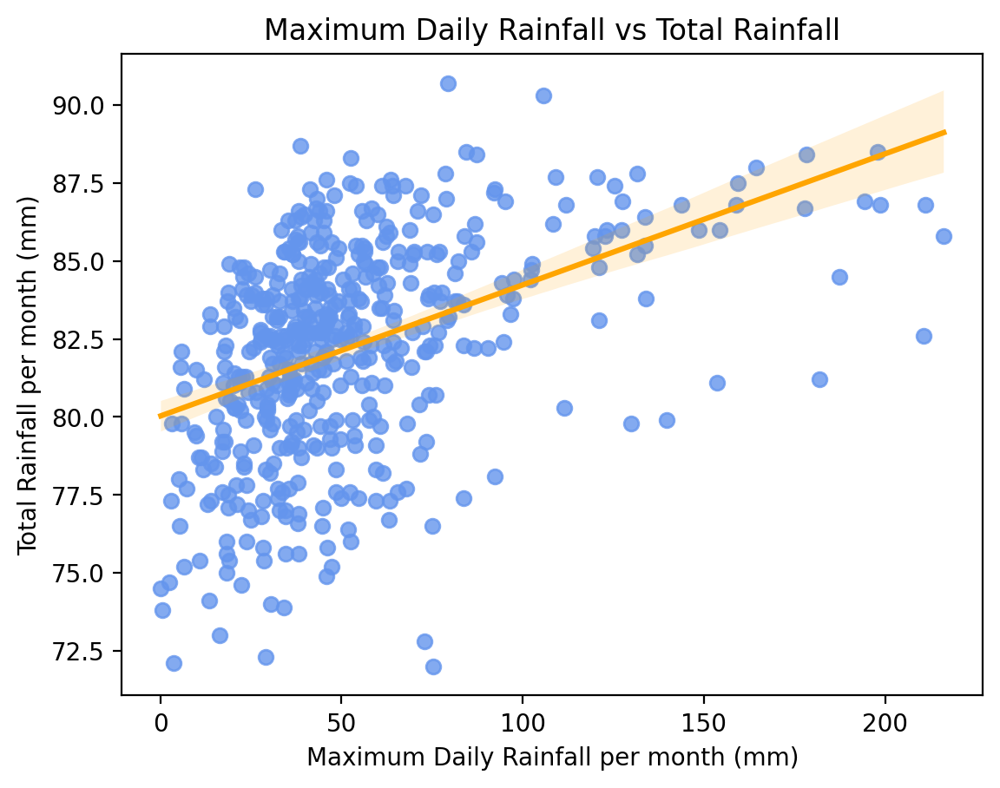

In [198]:
# Is there a correlation between the maximum_rainfall_in_a_day and mean_rh in the month? 
# What kind of correlation do your suspect? Does the graph show the same?
col1='maximum_rainfall_in_a_day'
col2='mean_rh'

remove_outliers_reg(col1, col2)

Correlation between no_of_rainy_days and total_rainfall is 0.6843292946650268 which indicates a strong positive correlation between the 2 variables.


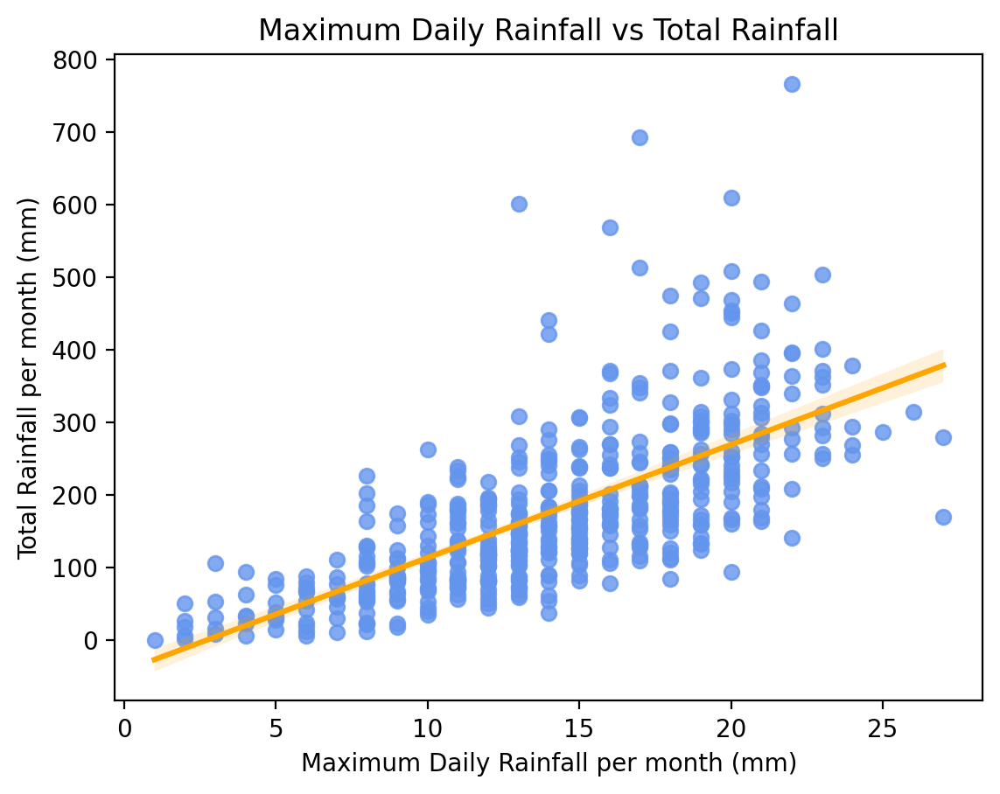

In [199]:
# Is there a correlation between the number of rainy days and total_rainfall in the month? 
# What kind of correlation do your suspect? Does the graph show the same?
col1='no_of_rainy_days'
col2='total_rainfall'

remove_outliers_reg(col1, col2)

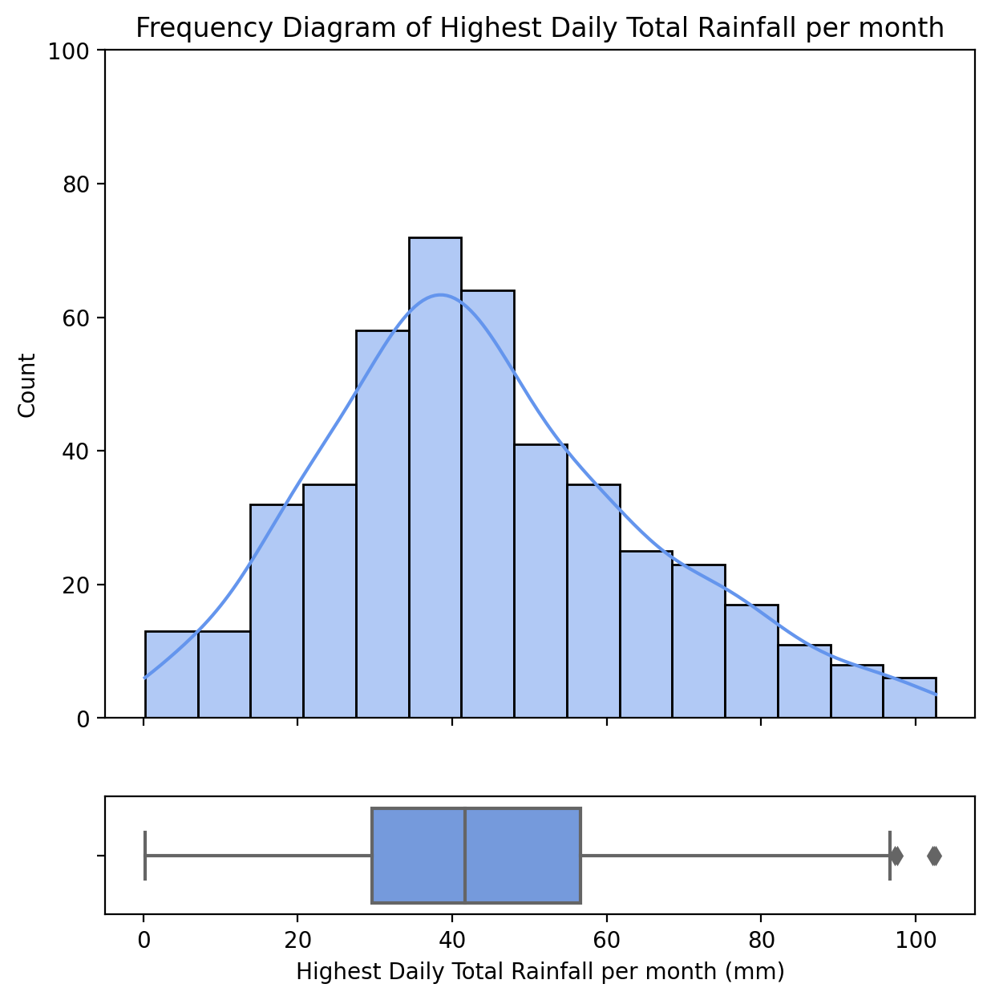

In [123]:
### Visualize distributions using histograms. If you have a lot, consider writing a custom function and use subplots.
# Fit a normal distribution to the data: mean and standard deviation

# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['maximum_rainfall_in_a_day']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#plot subplots
fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True,gridspec_kw={"height_ratios": (.85, .15)})

sns.histplot(data=filt,x='maximum_rainfall_in_a_day', kde=True,ax=axes[0], color='cornflowerblue').set(title='Frequency Diagram of Highest Daily Total Rainfall per month',xlabel='Highest Daily Total Rainfall per month (mm)',ylim=(0,100))

#plot boxplot
sns.boxplot(data=filt,x='maximum_rainfall_in_a_day',ax=axes[1], color='cornflowerblue').set(title='',xlabel='Highest Daily Total Rainfall per month (mm)')
None

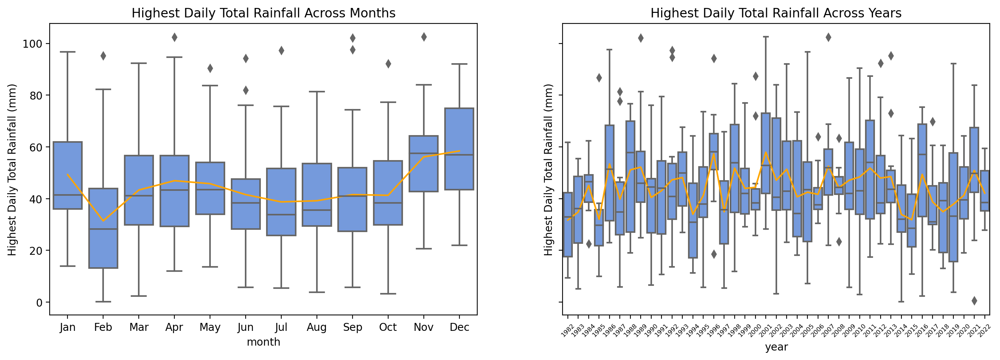

In [129]:
#create new cols for 'months' and 'years'
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['maximum_rainfall_in_a_day']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='maximum_rainfall_in_a_day', ax=axes[0], color='cornflowerblue', boxprops=dict(alpha=1)).set(title='Highest Daily Total Rainfall Across Months', ylabel='Highest Daily Total Rainfall (mm)')
sns.lineplot(data=filt, x='month', y='maximum_rainfall_in_a_day', ax=axes[0], color = 'orange',errorbar=None).set(title='Highest Daily Total Rainfall Across Months', ylabel='Highest Daily Total Rainfall (mm)')

sns.boxplot(data=filt, x='year', y='maximum_rainfall_in_a_day',ax=axes[1],color='cornflowerblue').set(title='Highest Daily Total Rainfall Across Years', ylabel='Highest Daily Total Rainfall (mm)')
sns.lineplot(data=filt, x='year', y='maximum_rainfall_in_a_day',ax=axes[1],color='orange',errorbar=None).set(title='Highest Daily Total Rainfall Across Years', ylabel='Highest Daily Total Rainfall (mm)')

axes[1].tick_params(rotation=45, labelsize=6)
None

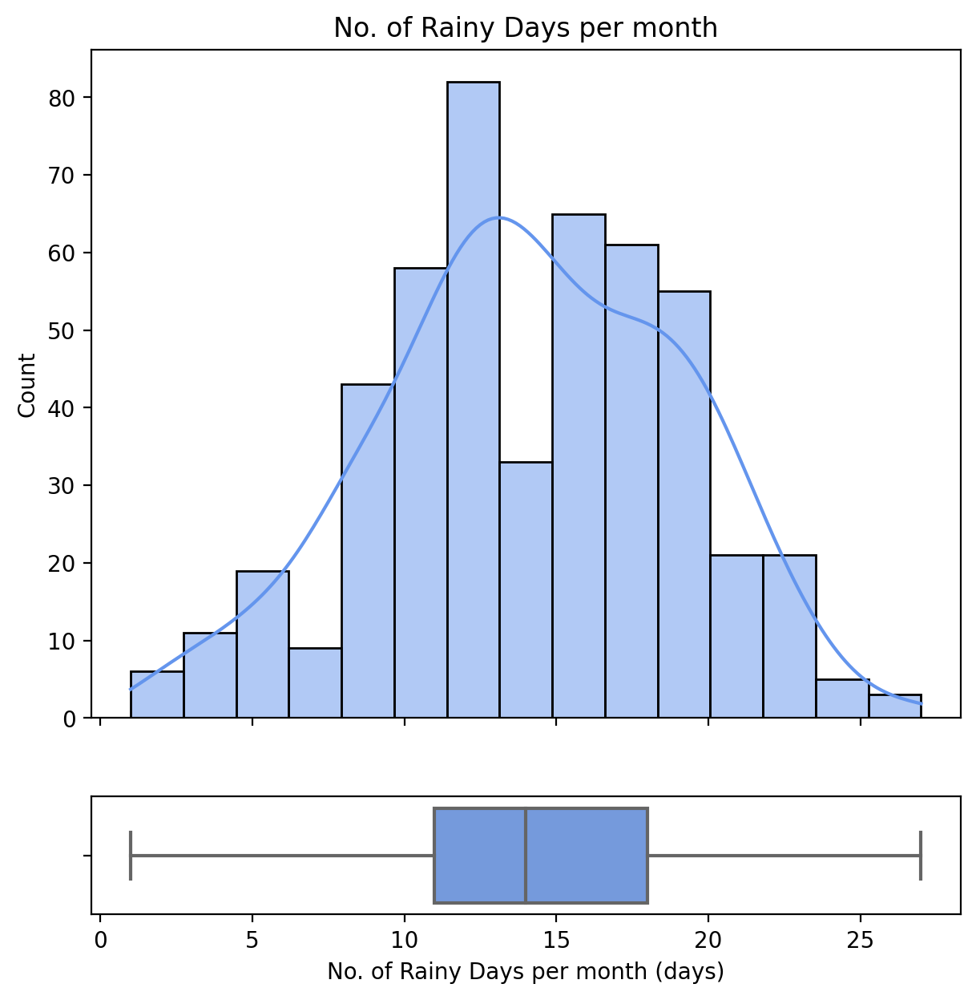

In [137]:
fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True,gridspec_kw={"height_ratios": (.85, .15)})

sns.histplot(climate,x='no_of_rainy_days',kde=True,color='cornflowerblue',ax=axes[0]).set(title='No. of Rainy Days per month', xlabel='No. of Rainy Days per month (days)')

#plot boxplot
sns.boxplot(climate,x='no_of_rainy_days',color='cornflowerblue').set(title='', xlabel='No. of Rainy Days per month (days)')
None

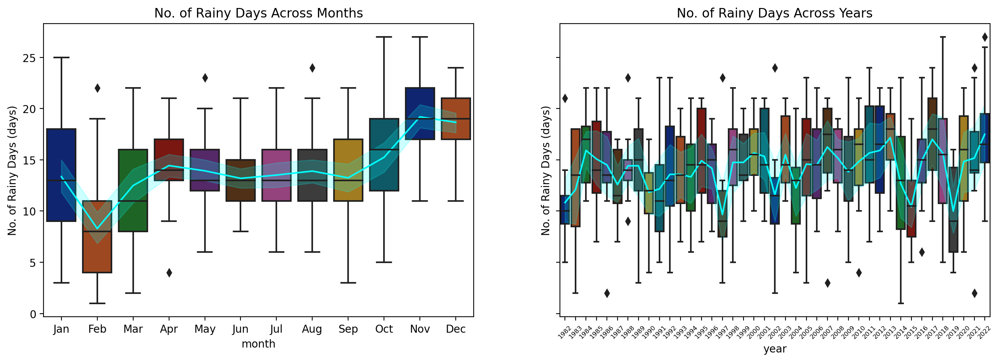

In [131]:
#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

climate['month'] = climate['date'].dt.strftime('%b')
sns.boxplot(data=climate, x='month', y='no_of_rainy_days', ax=axes[0], palette='dark').set(title='No. of Rainy Days Across Months', ylabel='No. of Rainy Days (days)')
sns.lineplot(data=climate, x='month', y='no_of_rainy_days', ax=axes[0], color='cyan').set(title='No. of Rainy Days Across Months', ylabel='No. of Rainy Days (days)')

climate['year'] = climate['date'].dt.strftime('%Y')
sns.boxplot(data=climate, x='year', y='no_of_rainy_days',ax=axes[1], palette='dark').set(title='No. of Rainy Days Across Years', ylabel='No. of Rainy Days (days)')
sns.lineplot(data=climate, x='year', y='no_of_rainy_days',ax=axes[1], color='cyan').set(title='No. of Rainy Days Across Years', ylabel='No. of Rainy Days (days)')
axes[1].tick_params(rotation=45, labelsize=6)
None

Number of rainy days seems to be getting more irratic through the years.

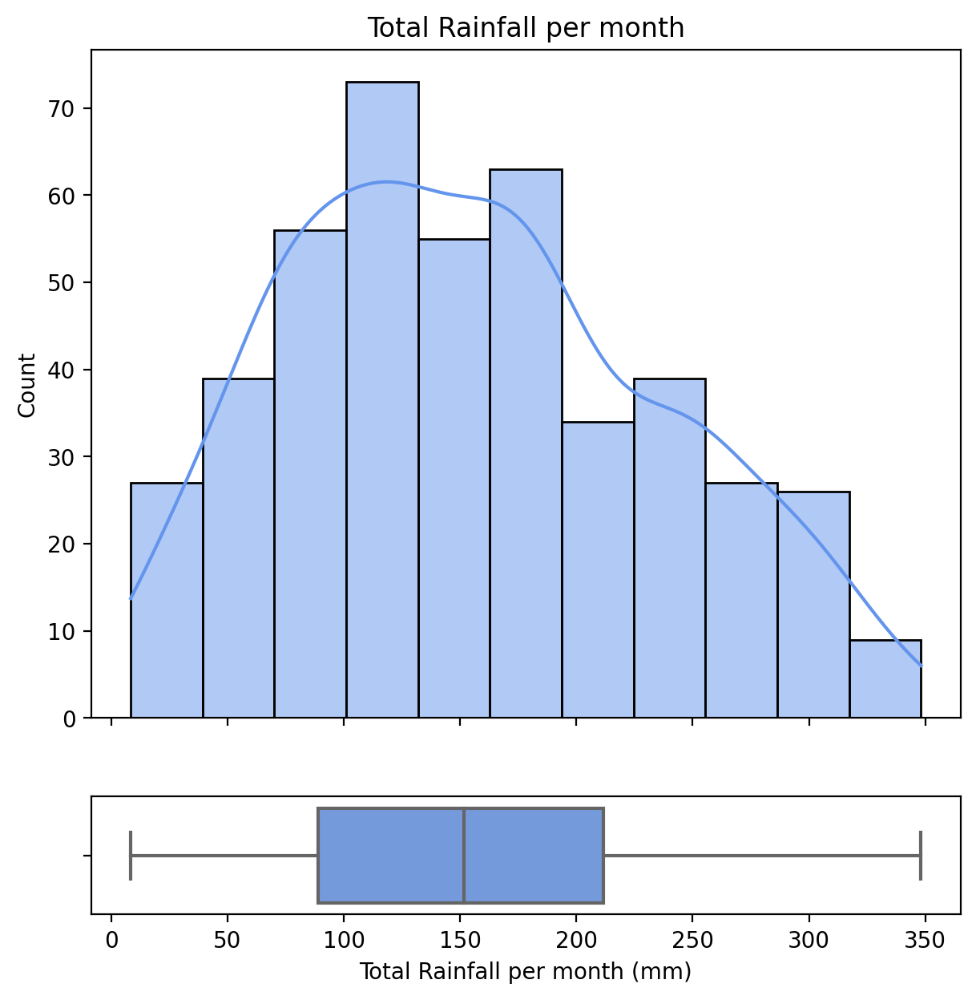

In [139]:
# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['total_rainfall']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#plot subplots
fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True,gridspec_kw={"height_ratios": (.85, .15)})

# Plot the histogram.
sns.histplot(filt,x='total_rainfall',kde=True,color='cornflowerblue',ax=axes[0]).set(title='Total Rainfall per month',xlabel='Total Rainfall per month (mm)')

#plot boxplot
sns.boxplot(filt,x='total_rainfall', color='cornflowerblue', ax=axes[1]).set(title='',xlabel='Total Rainfall per month (mm)')
None

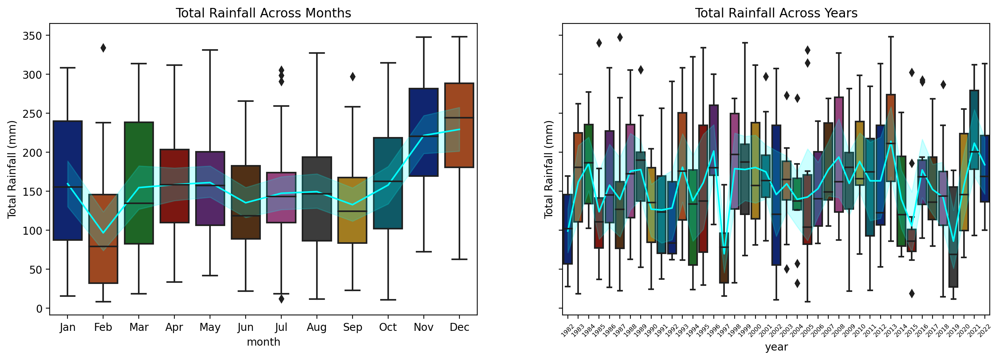

In [161]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['total_rainfall']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]


#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='total_rainfall', ax=axes[0], palette='dark').set(title='Total Rainfall Across Months', ylabel='Total Rainfall (mm)')
sns.lineplot(data=filt, x='month', y='total_rainfall', ax=axes[0], color='cyan').set(title='Total Rainfall Across Months', ylabel='Total Rainfall (mm)')

sns.boxplot(data=filt, x='year', y='total_rainfall',ax=axes[1], palette='dark').set(title='Total Rainfall Across Years', ylabel='Total Rainfall (mm)')
sns.lineplot(data=filt, x='year', y='total_rainfall',ax=axes[1], color='cyan').set(title='Total Rainfall Across Years', ylabel='Total Rainfall (mm)')
axes[1].tick_params(rotation=45, labelsize=6)
None

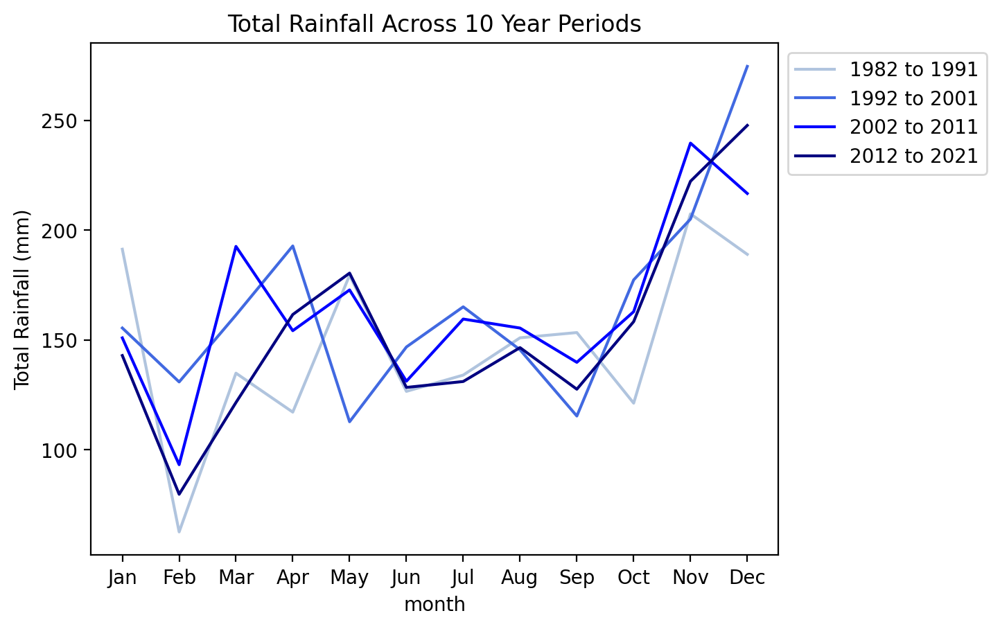

In [162]:
ax=sns.lineplot(filt.loc[filt['year'].isin(['1982','1983','1984','1985','1986','1987','1988','1989','1990','1991'])], x='month',y='total_rainfall',color='lightsteelblue', legend='auto', label='1982 to 1991',errorbar=None).set(title='Total Rainfall Across 10 Year Periods',ylabel='Total Rainfall (mm)')
ax=sns.lineplot(filt.loc[filt['year'].isin(['1992','1993','1994','1995','1996','1997','1998','1999','2000','2001'])], x='month',y='total_rainfall',color='royalblue', legend='auto', label='1992 to 2001',errorbar=None)
ax=sns.lineplot(filt.loc[filt['year'].isin(['2002','2003','2004','2005','2006','2007','2008','2009','2010','2011'])], x='month',y='total_rainfall',color='blue', legend='auto', label='2002 to 2011',errorbar=None)
ax=sns.lineplot(filt.loc[filt['year'].isin(['2012','2013','2014','2015','2016','2017','2018','2019','2020','2021'])], x='month',y='total_rainfall',color='navy', legend='auto', label='2012 to 2021',errorbar=None)
ax=sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
None

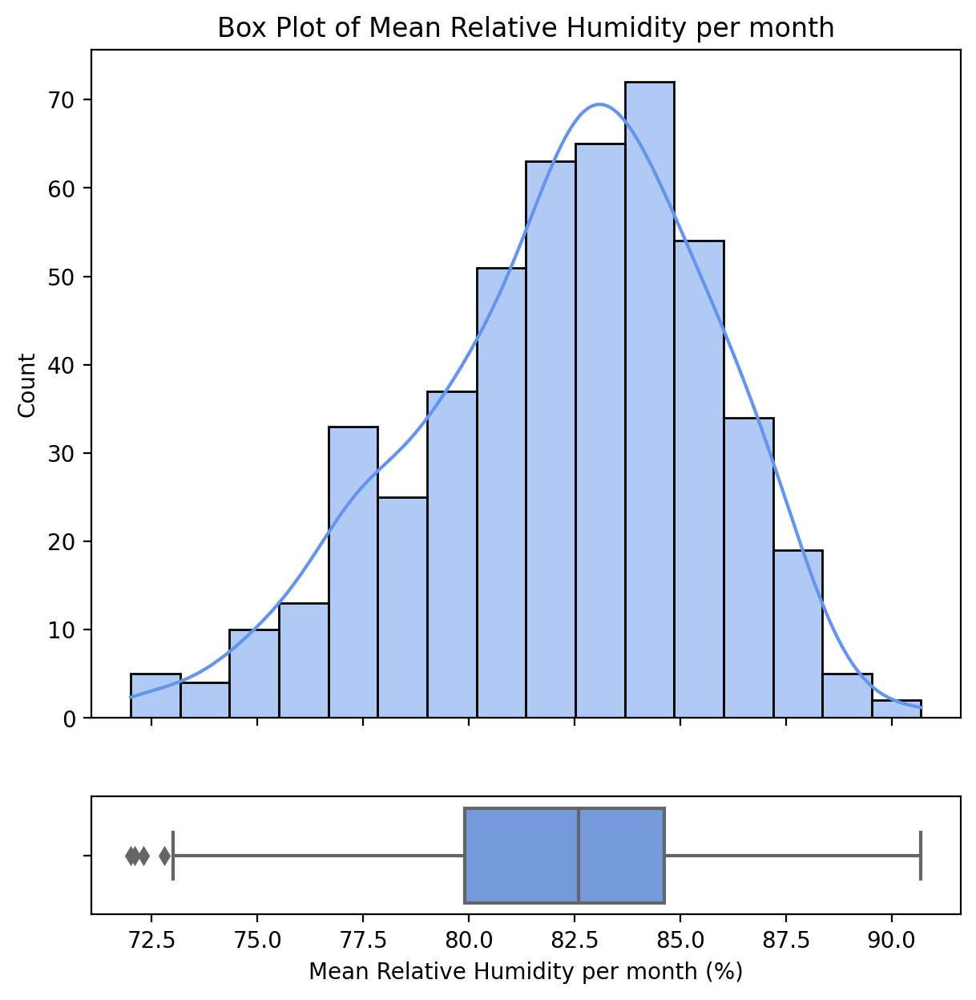

In [143]:
# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(climate,x='mean_rh',kde=True,color='cornflowerblue',ax=axes[0]).set(title='Box Plot of Mean Relative Humidity per month',xlabel='Mean Relative Humidity per month (%)')

#plot boxplot
sns.boxplot(climate,x='mean_rh',color='cornflowerblue',ax=axes[1]).set(title='',xlabel='Mean Relative Humidity per month (%)')
None

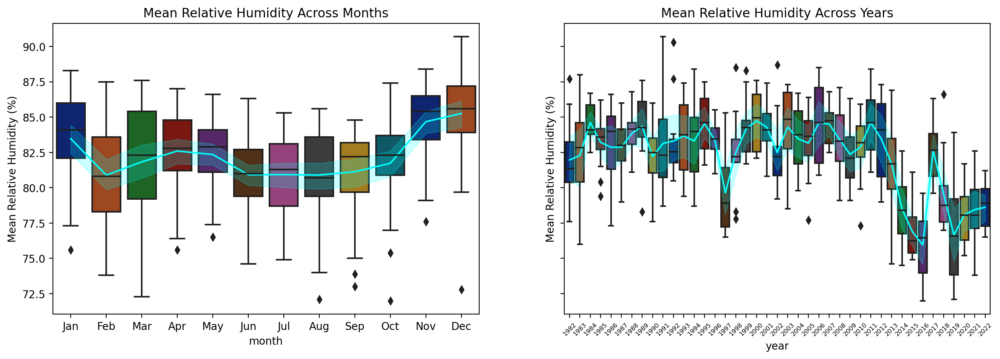

In [152]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=climate, x='month', y='mean_rh', ax=axes[0], palette='dark').set(title='Mean Relative Humidity Across Months', ylabel='Mean Relative Humidity (%)')
sns.lineplot(data=climate, x='month', y='mean_rh', ax=axes[0], color='cyan').set(title='Mean Relative Humidity Across Months', ylabel='Mean Relative Humidity (%)')

sns.boxplot(data=climate, x='year', y='mean_rh',ax=axes[1], palette='dark').set(title='Mean Relative Humidity Across Years', ylabel='Mean Relative Humidity (%)')
sns.lineplot(data=climate, x='year', y='mean_rh',ax=axes[1], color='cyan').set(title='Mean Relative Humidity Across Years', ylabel='Mean Relative Humidity (%)')
axes[1].tick_params(rotation=45, labelsize=6)
None

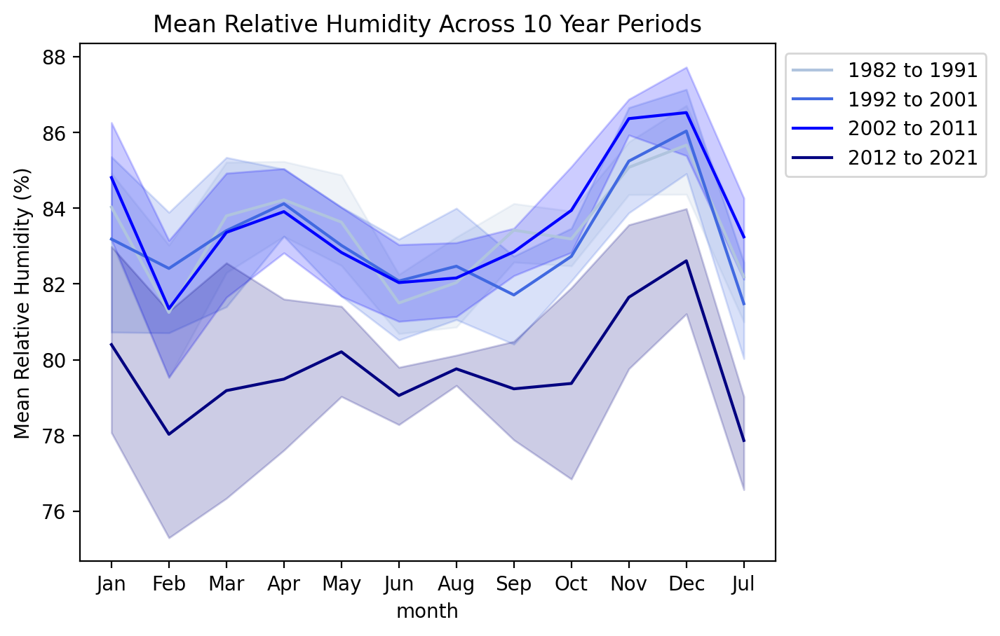

In [160]:
ax=sns.lineplot(climate.loc[climate['year'].isin(['1982','1983','1984','1985','1986','1987','1988','1989','1990','1991'])], x='month',y='mean_rh',color='lightsteelblue', legend='auto', label='1982 to 1991').set(title='Mean Relative Humidity Across 10 Year Periods',ylabel='Mean Relative Humidity (%)')
ax=sns.lineplot(climate.loc[climate['year'].isin(['1992','1993','1994','1995','1996','1997','1998','1999','2000','2001'])], x='month',y='mean_rh',color='royalblue', legend='auto', label='1992 to 2001')
ax=sns.lineplot(climate.loc[climate['year'].isin(['2002','2003','2004','2005','2006','2007','2008','2009','2010','2011'])], x='month',y='mean_rh',color='blue', legend='auto', label='2002 to 2011')
ax=sns.lineplot(climate.loc[climate['year'].isin(['2012','2013','2014','2015','2016','2017','2018','2019','2020','2021'])], x='month',y='mean_rh',color='navy', legend='auto', label='2012 to 2021')
ax=sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
None

Relatively large dip in humidity levels in recent years.

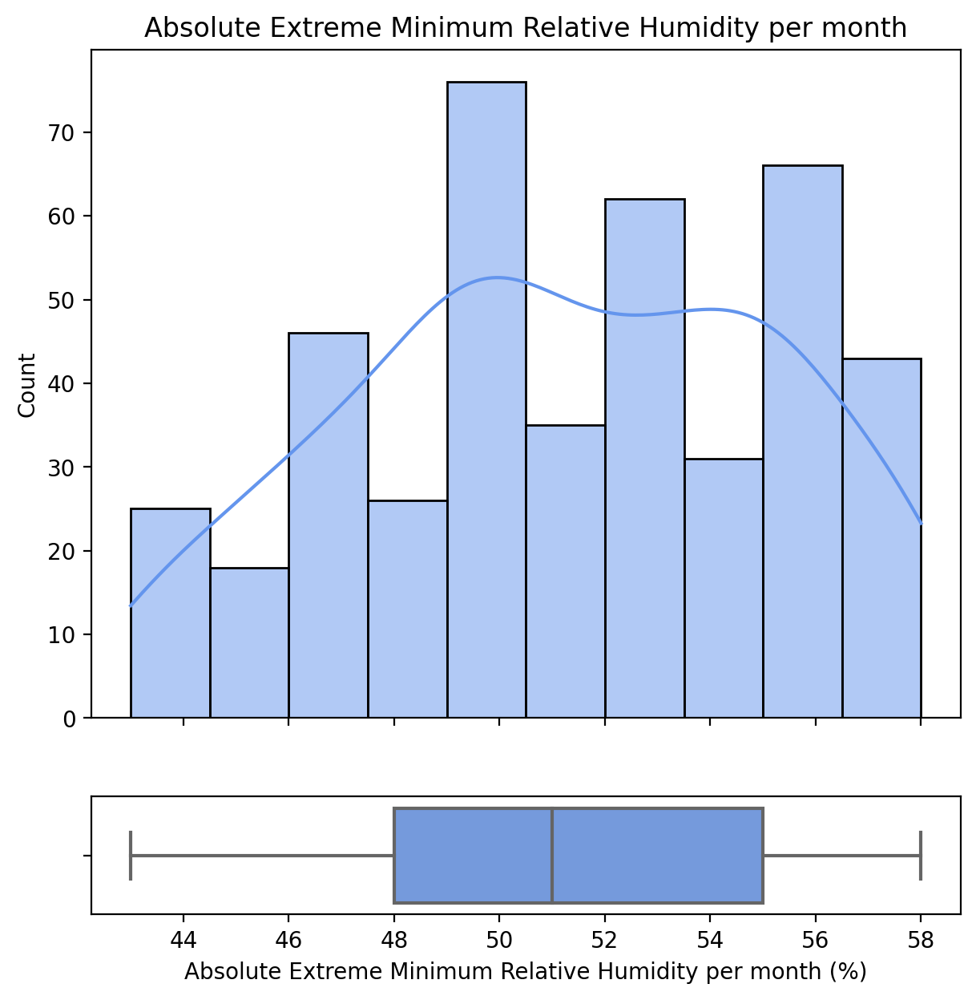

In [159]:
# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['rh_extremes_minimum']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(filt,x='rh_extremes_minimum',kde=True,color='cornflowerblue',ax=axes[0]).set(title='Absolute Extreme Minimum Relative Humidity per month',xlabel='Absolute Extreme Minimum Relative Humidity per month (%)')

#plot boxplot
sns.boxplot(filt,x='rh_extremes_minimum',color='cornflowerblue',ax=axes[1]).set(title='',xlabel='Absolute Extreme Minimum Relative Humidity per month (%)')
None

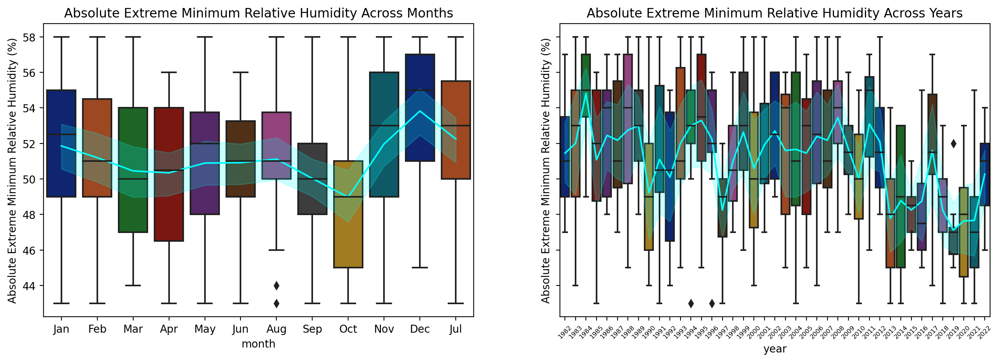

In [151]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['rh_extremes_minimum']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='rh_extremes_minimum', ax=axes[0], palette='dark').set(title='Absolute Extreme Minimum Relative Humidity Across Months', ylabel='Absolute Extreme Minimum Relative Humidity (%)')
sns.lineplot(data=filt, x='month', y='rh_extremes_minimum', ax=axes[0], color='cyan').set(title='Absolute Extreme Minimum Relative Humidity Across Months', ylabel='Absolute Extreme Minimum Relative Humidity (%)')

sns.boxplot(data=filt, x='year', y='rh_extremes_minimum',ax=axes[1], palette='dark').set(title='Absolute Extreme Minimum Relative Humidity Across Years', ylabel='Absolute Extreme Minimum Relative Humidity (%)')
sns.lineplot(data=filt, x='year', y='rh_extremes_minimum',ax=axes[1], color='cyan').set(title='Absolute Extreme Minimum Relative Humidity Across Years', ylabel='Absolute Extreme Minimum Relative Humidity (%)')
axes[1].tick_params(rotation=45, labelsize=6)
None

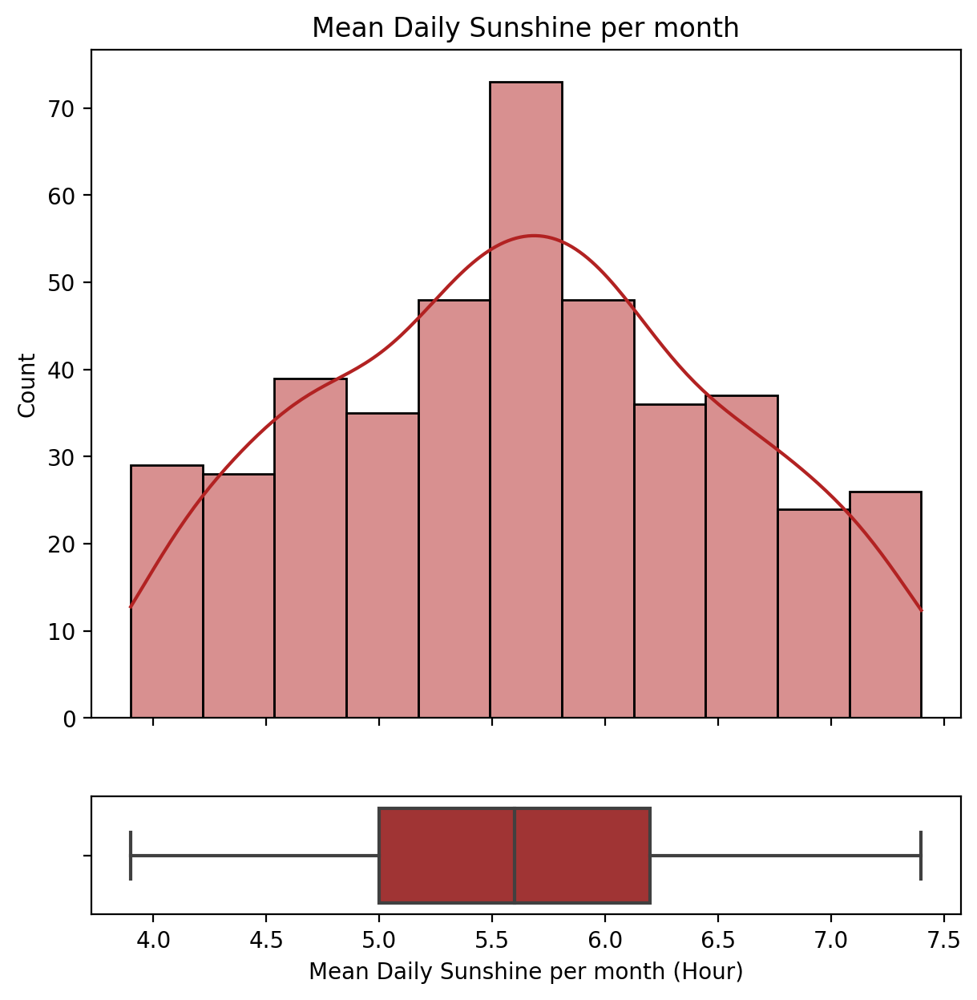

In [193]:
# outliers / anomalies = above OR below mean plus OR minus 1.5 times the standard deviation
col_filt = climate['mean_sunshine_hrs']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(filt,x='mean_sunshine_hrs',kde=True,color='firebrick',ax=axes[0]).set(title='Mean Daily Sunshine per month',xlabel='Mean Daily Sunshine per month (Hour)')

#plot boxplot
sns.boxplot(filt,x='mean_sunshine_hrs',color='firebrick',ax=axes[1]).set(title='',xlabel='Mean Daily Sunshine per month (Hour)')
None

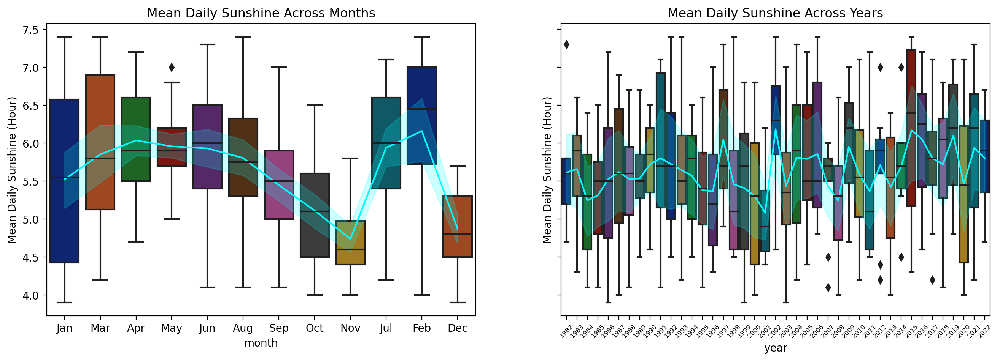

In [164]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# filters
col_filt = climate['mean_sunshine_hrs']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='mean_sunshine_hrs', ax=axes[0], palette='dark').set(title='Mean Daily Sunshine Across Months', ylabel='Mean Daily Sunshine (Hour)')
sns.lineplot(data=filt, x='month', y='mean_sunshine_hrs', ax=axes[0], color='cyan').set(title='Mean Daily Sunshine Across Months', ylabel='Mean Daily Sunshine (Hour)')

sns.boxplot(data=filt, x='year', y='mean_sunshine_hrs',ax=axes[1], palette='dark').set(title='Mean Daily Sunshine Across Years', ylabel='Mean Daily Sunshine (Hour)')
sns.lineplot(data=filt, x='year', y='mean_sunshine_hrs',ax=axes[1], color='cyan').set(title='Mean Daily Sunshine Across Years', ylabel='Mean Daily Sunshine (Hour)')
axes[1].tick_params(rotation=45, labelsize=6)
None

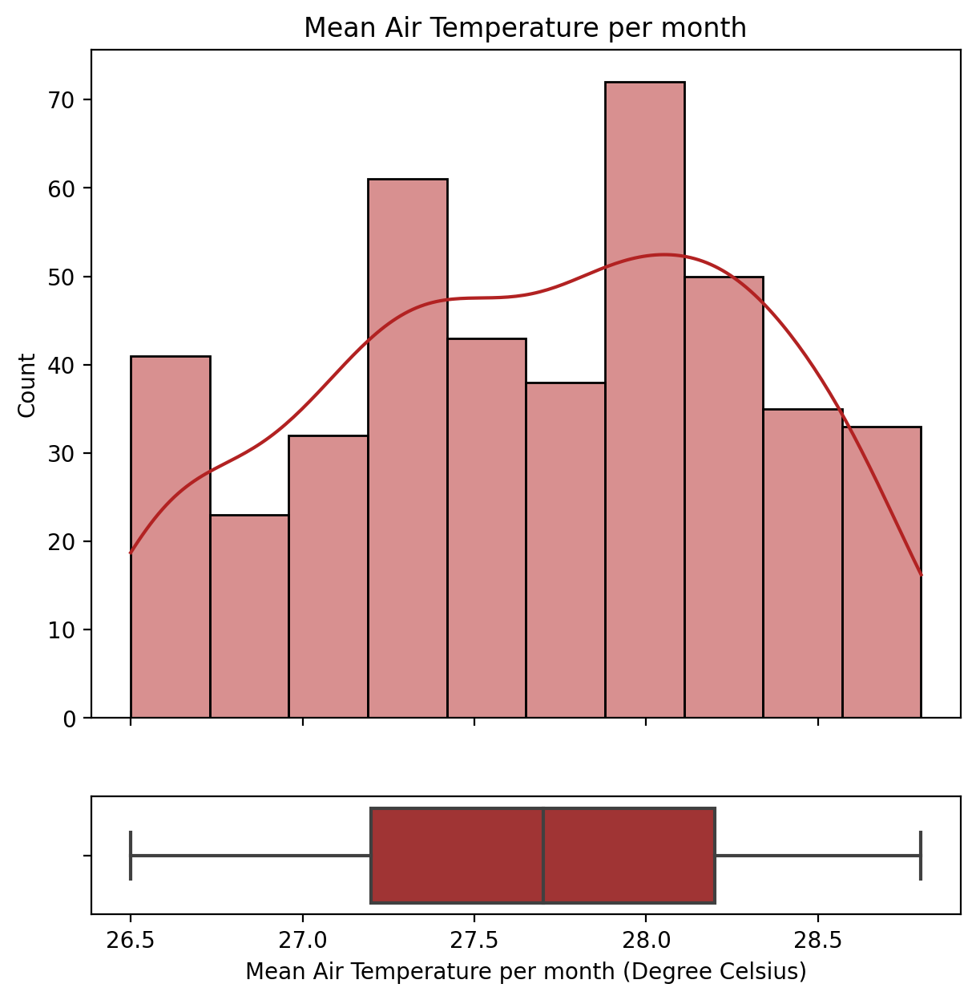

In [185]:
# filters
col_filt = climate['mean_temp']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplot
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(filt,x='mean_temp',kde=True,color='firebrick',ax=axes[0]).set(title='Mean Air Temperature per month',xlabel='Mean Air Temperature per month (Degree Celsius)')

#plot boxplot
sns.boxplot(filt,x='mean_temp', color='firebrick',ax=axes[1]).set(title='',xlabel='Mean Air Temperature per month (Degree Celsius)')
None

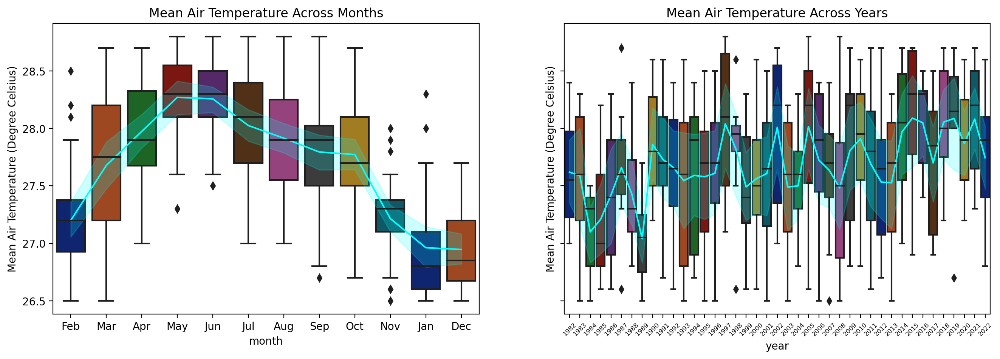

In [168]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# filters
col_filt = climate['mean_temp']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='mean_temp', ax=axes[0], palette='dark').set(title='Mean Air Temperature Across Months', ylabel='Mean Air Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='month', y='mean_temp', ax=axes[0], color='cyan').set(title='Mean Air Temperature Across Months', ylabel='Mean Air Temperature (Degree Celsius)')

sns.boxplot(data=filt, x='year', y='mean_temp',ax=axes[1], palette='dark').set(title='Mean Air Temperature Across Years', ylabel='Mean Air Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='year', y='mean_temp',ax=axes[1], color='cyan').set(title='Mean Air Temperature Across Years', ylabel='Mean Air Temperature (Degree Celsius)')
axes[1].tick_params(rotation=45, labelsize=6)
None

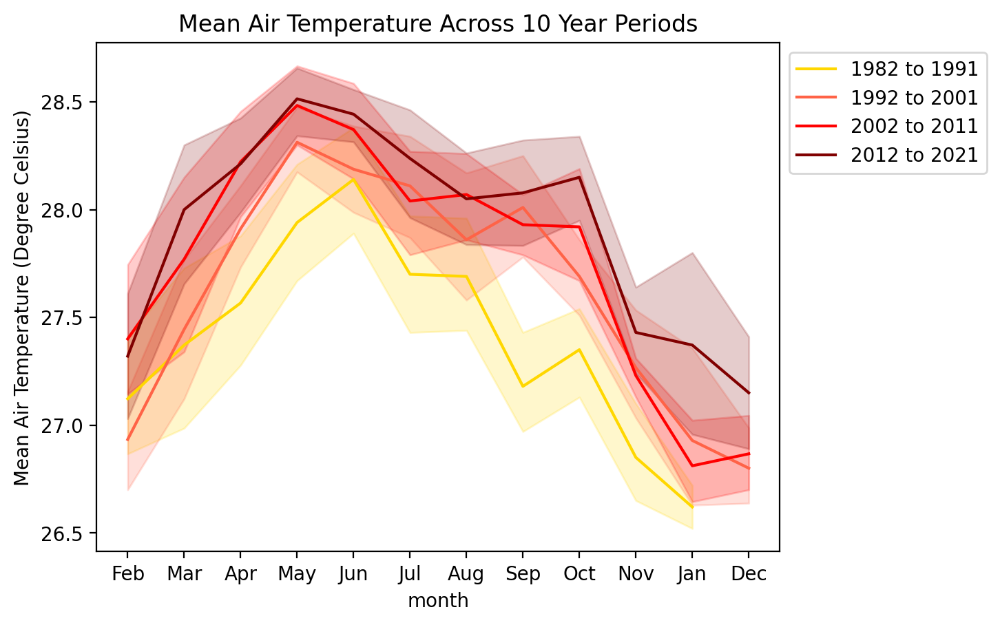

In [169]:
ax=sns.lineplot(filt.loc[filt['year'].isin(['1982','1983','1984','1985','1986','1987','1988','1989','1990','1991'])], x='month',y='mean_temp',color='gold', legend='auto', label='1982 to 1991').set(title='Mean Air Temperature Across 10 Year Periods', ylabel='Mean Air Temperature (Degree Celsius)')
ax=sns.lineplot(filt.loc[filt['year'].isin(['1992','1993','1994','1995','1996','1997','1998','1999','2000','2001'])], x='month',y='mean_temp',color='tomato', legend='auto', label='1992 to 2001')
ax=sns.lineplot(filt.loc[filt['year'].isin(['2002','2003','2004','2005','2006','2007','2008','2009','2010','2011'])], x='month',y='mean_temp',color='red', legend='auto', label='2002 to 2011')
ax=sns.lineplot(filt.loc[filt['year'].isin(['2012','2013','2014','2015','2016','2017','2018','2019','2020','2021'])], x='month',y='mean_temp',color='maroon', legend='auto', label='2012 to 2021')
sns.move_legend(ax,'upper left',bbox_to_anchor=(1,1))
None

Humidity and temperature is inversely proportional. Temperature in Singapore has been increasing while relative humidity has been decreasing.

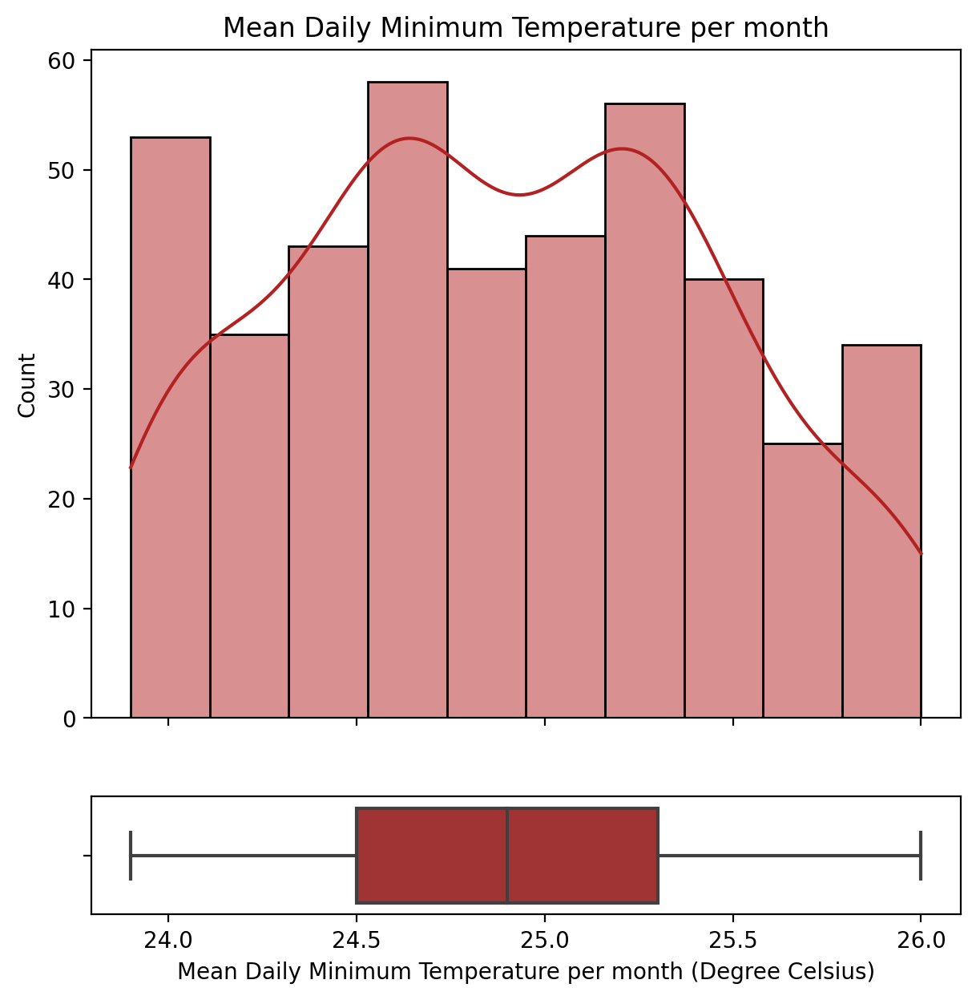

In [186]:
# filters
col_filt = climate['temp_mean_daily_min']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(data=filt,x='temp_mean_daily_min',kde=True,color='firebrick',ax=axes[0]).set(title='Mean Daily Minimum Temperature per month',xlabel='Mean Daily Minimum Temperature per month (Degree Celsius)')

#plot boxplot
sns.boxplot(data=filt,x='temp_mean_daily_min',color='firebrick',ax=axes[1]).set(title='',xlabel='Mean Daily Minimum Temperature per month (Degree Celsius)')
None

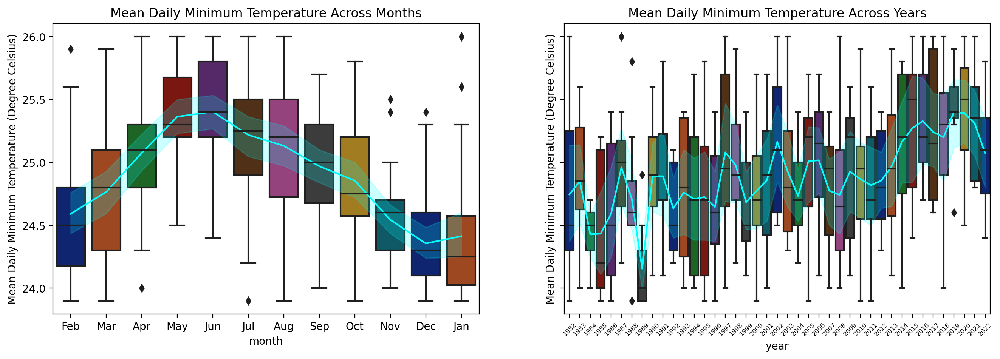

In [173]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# filters
col_filt = climate['temp_mean_daily_min']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='temp_mean_daily_min', ax=axes[0], palette='dark').set(title='Mean Daily Minimum Temperature Across Months', ylabel='Mean Daily Minimum Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='month', y='temp_mean_daily_min', ax=axes[0], color='cyan').set(title='Mean Daily Minimum Temperature Across Months', ylabel='Mean Daily Minimum Temperature (Degree Celsius)')

sns.boxplot(data=filt, x='year', y='temp_mean_daily_min',ax=axes[1], palette='dark').set(title='Mean Daily Minimum Temperature Across Years', ylabel='Mean Daily Minimum Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='year', y='temp_mean_daily_min',ax=axes[1], color='cyan').set(title='Mean Daily Minimum Temperature Across Years', ylabel='Mean Daily Minimum Temperature (Degree Celsius)')
axes[1].tick_params(rotation=45, labelsize=6)
None

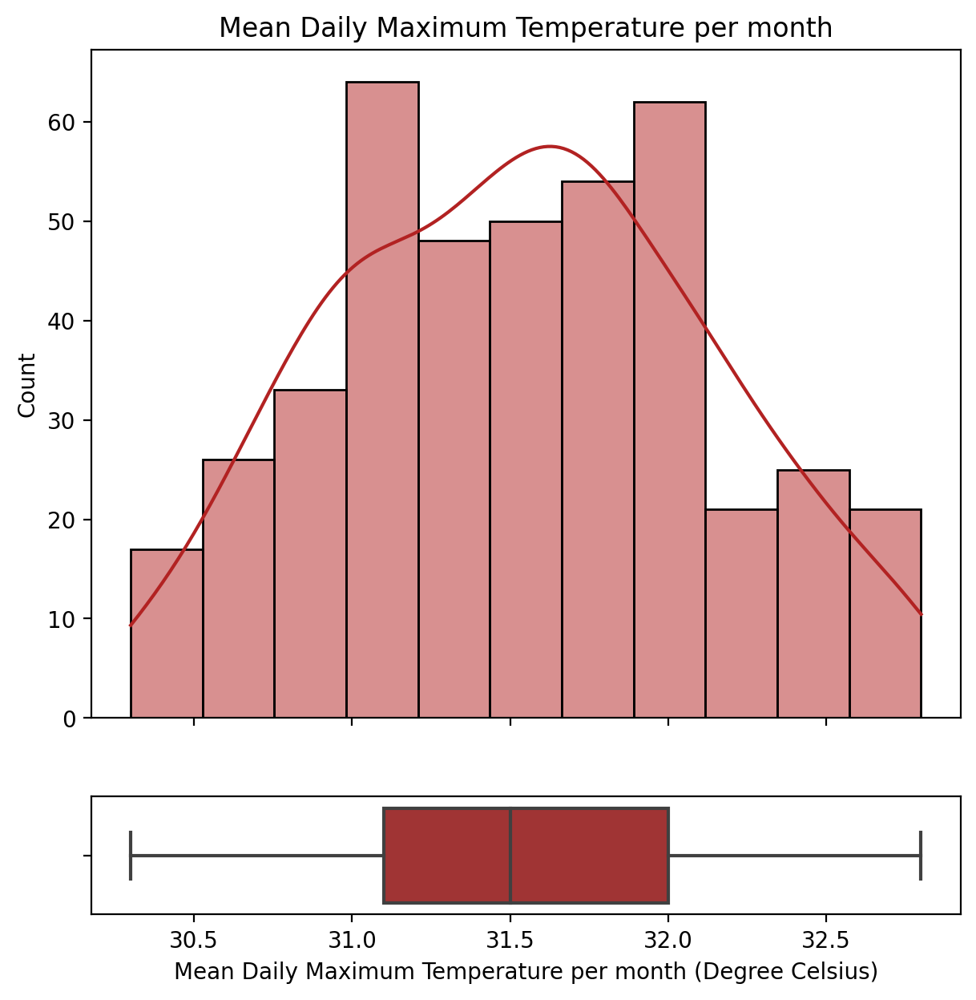

In [187]:
# filters
col_filt = climate['temp_mean_daily_max']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(data=filt,x='temp_mean_daily_max',kde=True,ax=axes[0],color='firebrick').set(title='Mean Daily Maximum Temperature per month',xlabel='Mean Daily Maximum Temperature per month (Degree Celsius)')

#plot boxplot
sns.boxplot(data=filt,x='temp_mean_daily_max',ax=axes[1],color='firebrick').set(title='',xlabel='Mean Daily Maximum Temperature per month (Degree Celsius)')
None

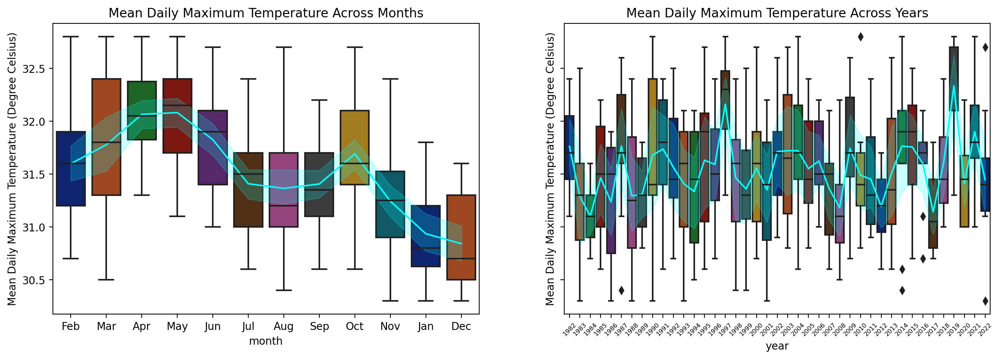

In [178]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# filters
col_filt = climate['temp_mean_daily_max']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='temp_mean_daily_max', ax=axes[0], palette='dark').set(title='Mean Daily Maximum Temperature Across Months', ylabel='Mean Daily Maximum Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='month', y='temp_mean_daily_max', ax=axes[0], color='cyan').set(title='Mean Daily Maximum Temperature Across Months', ylabel='Mean Daily Maximum Temperature (Degree Celsius)')

sns.boxplot(data=filt, x='year', y='temp_mean_daily_max',ax=axes[1], palette='dark').set(title='Mean Daily Maximum Temperature Across Years', ylabel='Mean Daily Maximum Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='year', y='temp_mean_daily_max',ax=axes[1], color='cyan').set(title='Mean Daily Maximum Temperature Across Years', ylabel='Mean Daily Maximum Temperature (Degree Celsius)')
axes[1].tick_params(rotation=45, labelsize=6)
None

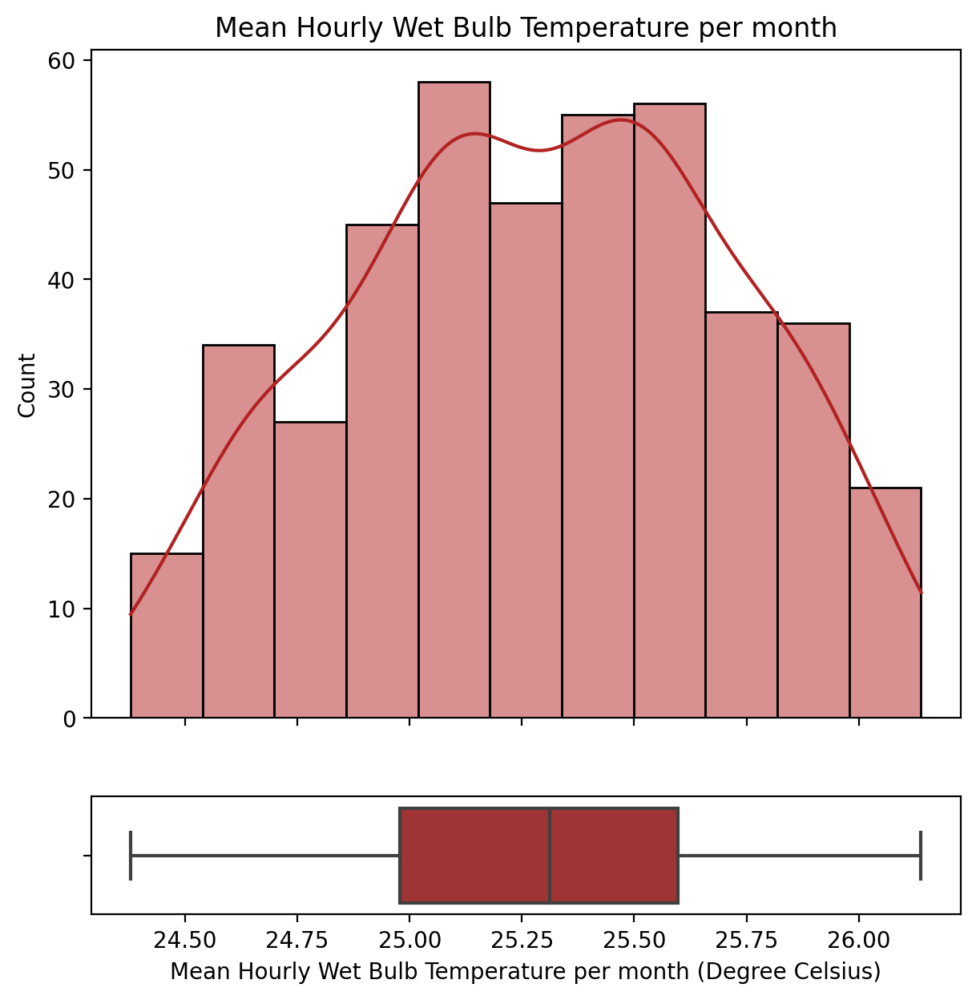

In [188]:
# filters
col_filt = climate['wet_bulb_temperature']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

# subplots
fig, axes = plt.subplots(2,1,figsize=(7,7),sharex=True,gridspec_kw={'height_ratios':(0.85,0.15)})

# Plot the actual histogram.
sns.histplot(data = filt, x='wet_bulb_temperature',kde=True,ax=axes[0],color='firebrick').set(title='Mean Hourly Wet Bulb Temperature per month',xlabel='Mean Hourly Wet Bulb Temperature per month (Degree Celsius)')

#plot boxplot
sns.boxplot(data = filt, x='wet_bulb_temperature',ax=axes[1],color='firebrick').set(title='',xlabel='Mean Hourly Wet Bulb Temperature per month (Degree Celsius)')
None

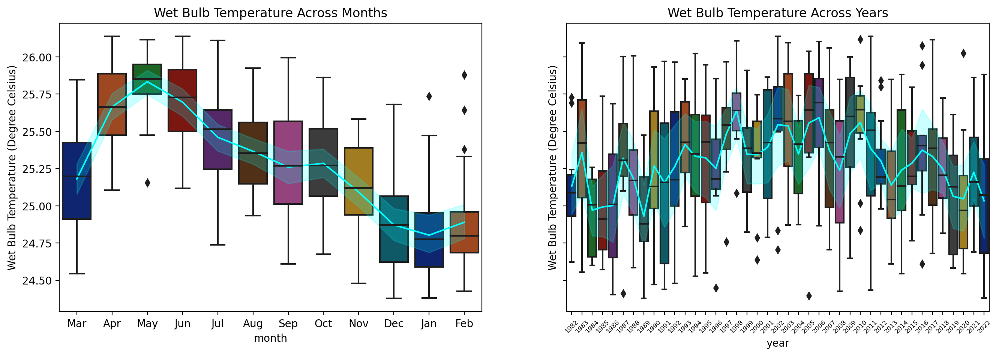

In [184]:
climate['month'] = climate['date'].dt.strftime('%b')
climate['year'] = climate['date'].dt.strftime('%Y')

# filters
col_filt = climate['wet_bulb_temperature']
filt = climate.loc[(col_filt <= col_filt.mean() + 1.5 * col_filt.std()) & (col_filt >= col_filt.mean() - 1.5 * col_filt.std())]

#create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.boxplot(data=filt, x='month', y='wet_bulb_temperature', ax=axes[0], palette='dark').set(title='Wet Bulb Temperature Across Months', ylabel='Wet Bulb Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='month', y='wet_bulb_temperature', ax=axes[0], color='cyan').set(title='Wet Bulb Temperature Across Months', ylabel='Wet Bulb Temperature (Degree Celsius)')

sns.boxplot(data=filt, x='year', y='wet_bulb_temperature',ax=axes[1], palette='dark').set(title='Wet Bulb Temperature Across Years', ylabel='Wet Bulb Temperature (Degree Celsius)')
sns.lineplot(data=filt, x='year', y='wet_bulb_temperature',ax=axes[1], color='cyan').set(title='Wet Bulb Temperature Across Years', ylabel='Wet Bulb Temperature (Degree Celsius)')
axes[1].tick_params(rotation=45, labelsize=6)
None

In [189]:
# create new col that shows month of the row
wet_bulb_temp['wbt_date'] = pd.to_datetime(wet_bulb_temp['wbt_date'])
wet_bulb_temp['month']=wet_bulb_temp['wbt_date'].dt.strftime('%b')

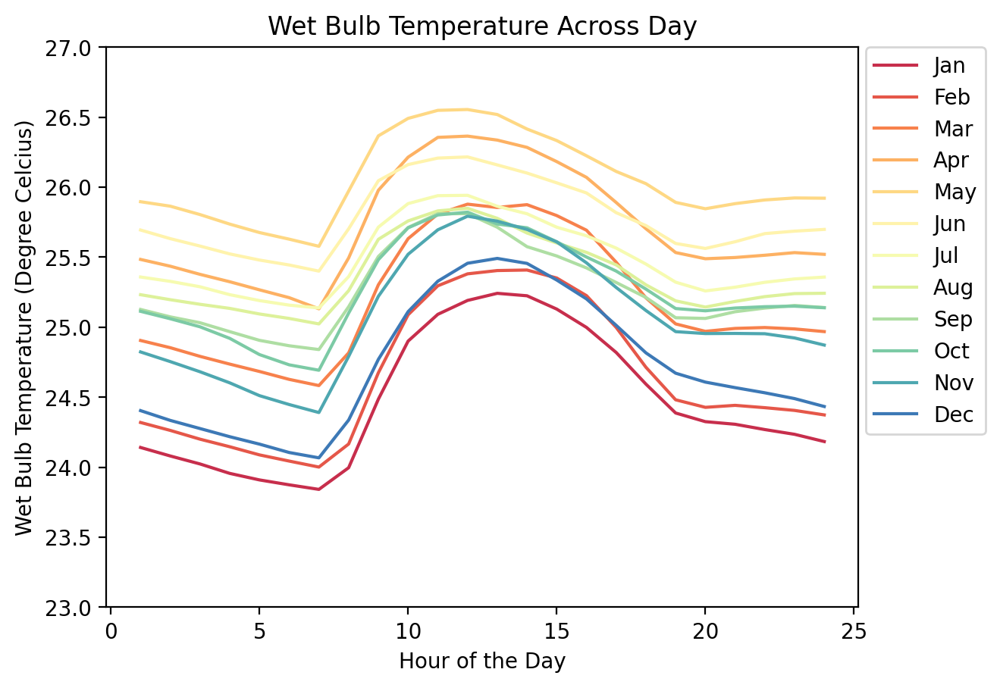

In [190]:
# plot different months in the same graph
sns.lineplot(data=wet_bulb_temp,x='wbt_time',y='wet_bulb_temperature',hue='month',palette='Spectral', errorbar=None).set(ylim=(23,27), title='Wet Bulb Temperature Across Day', xlabel='Hour of the Day',ylabel='Wet Bulb Temperature (Degree Celcius)')
plt.legend(bbox_to_anchor=(1.01,1), loc='upper left', borderaxespad=0)

None

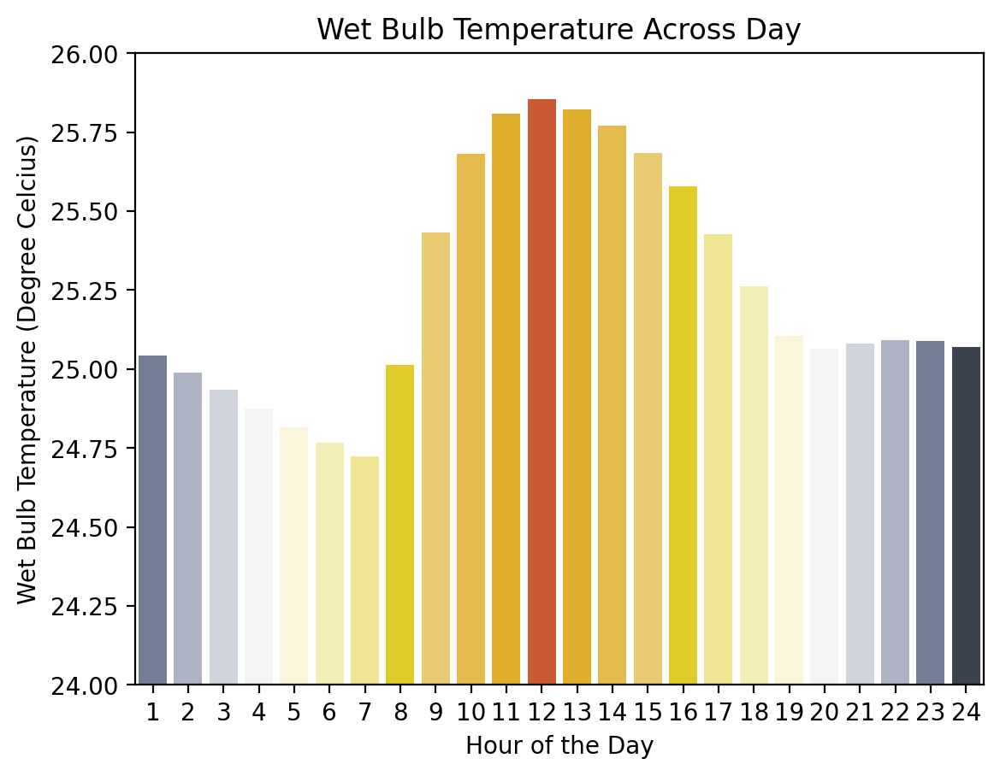

In [191]:
# mean wet bulb temp across day
pal=["#6D7A9C","#AAB2C5","#CED3DE","#F3F4F7","#FFFAD6","#FFF5AD","#FFF185","#FFE20A","#FDD25E","#FDC835","#FDBD0D",'#E24E1B',"#FDBD0D","#FDC835","#FDD25E","#FFE20A","#FFF185","#FFF5AD","#FFFAD6","#F3F4F7","#CED3DE","#AAB2C5","#6D7A9C","#394053"]
sns.barplot(wet_bulb_temp[wet_bulb_temp['wbt_time']!=0],x='wbt_time',y=wet_bulb_temp['wet_bulb_temperature'],errorbar=None,palette=pal).set(ylim=(24,26), title='Wet Bulb Temperature Across Day', xlabel='Hour of the Day',ylabel='Wet Bulb Temperature (Degree Celcius)')
None

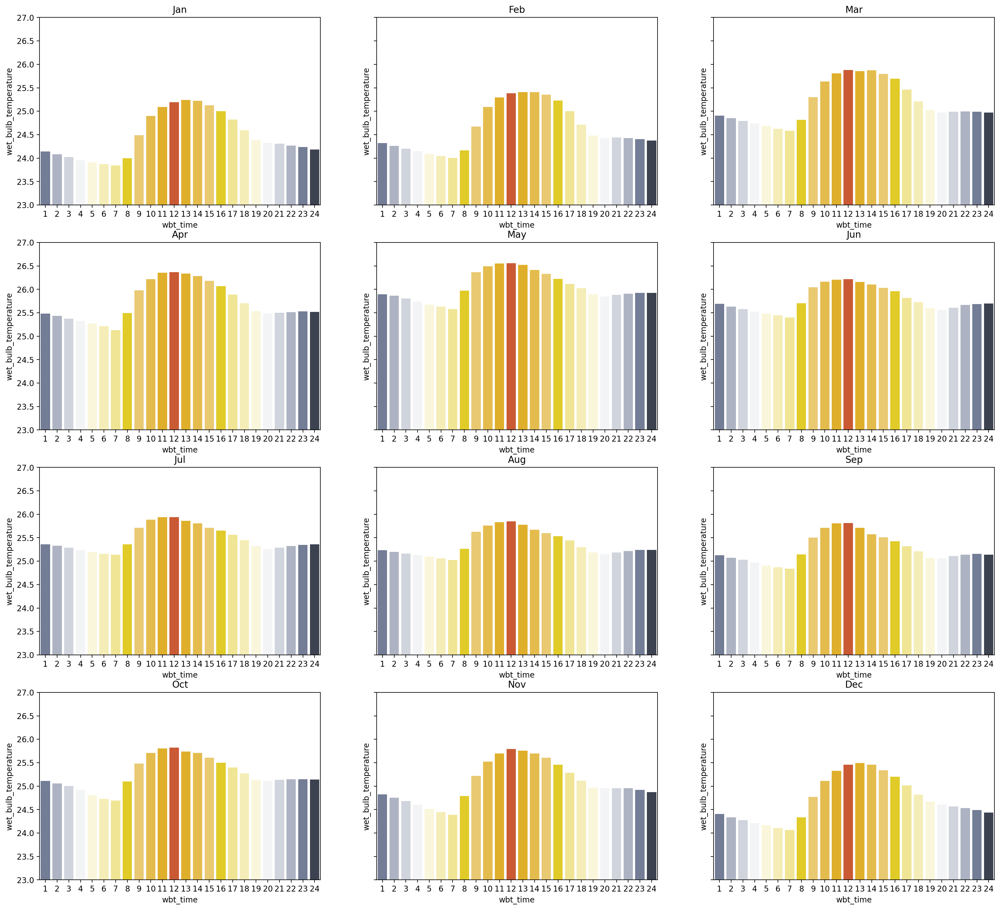

In [192]:
# wet bulb temp across day (diff months)
lst_months=wet_bulb_temp['month'].unique()

fig, axes = plt.subplots(4, 3, figsize=(22, 20), sharey=True)

for i, ax in zip(lst_months,axes.flat):
    sns.barplot(data=wet_bulb_temp[wet_bulb_temp['month']==i],x='wbt_time',y='wet_bulb_temperature',ax=ax,errorbar=None,palette=pal).set(ylim=(23,27),title=i)
None

## Conclusions and Recommendations

Based on your exploration of the data, what are you key takeaways and recommendations? Make sure to answer your question of interest or address your problem statement here.

**To-Do:** *Edit this cell with your conclusions and recommendations.*

Don't forget to create your README!

**To-Do:** *If you combine your problem statement, data dictionary, brief summary of your analysis, and conclusions/recommendations, you have an amazing README.md file that quickly aligns your audience to the contents of your project.* Don't forget to cite your data sources!